## Group 8 Project
## Group members name:<br> Chekwube Ononuju<br> Somto Onumajuru
## Title of the notebook:<br> POWER CONSUMPTION MODELS
## Date:<br> 05/01/2024

In [12]:
# Preamble script block to identify host, user, and kernel
import sys
! hostname
! whoami
print(sys.executable)
print(sys.version)
print(sys.version_info)

Chekzs-MacBook-Air-2.local
chekzononuju
/Users/chekzononuju/anaconda3/bin/python
3.11.5 (main, Sep 11 2023, 08:31:25) [Clang 14.0.6 ]
sys.version_info(major=3, minor=11, micro=5, releaselevel='final', serial=0)


In [13]:
import numpy as np                        # For numerical computing
import pandas as pd                       # For data manipulation and analysis
import matplotlib.pyplot as plt           # For creating static, animated, and interactive visualizations
import seaborn as sns                     # For high-level interface for drawing attractive and informative statistical graphics
from sklearn.model_selection import train_test_split  # For splitting data arrays into two subsets: for training data and for testing data
from sklearn.preprocessing import StandardScaler      # For standardization of datasets
from sklearn.svm import SVR                           # Support Vector Regression
from sklearn.ensemble import RandomForestRegressor    # A meta estimator that fits a number of classifying decision trees on various sub-samples of the dataset
from sklearn.linear_model import LinearRegression     # For performing linear and polynomial regression
from sklearn.metrics import mean_squared_error, r2_score  # For calculating mean squared error and R^2 Score, which are metrics for model evaluation
import gradio as gr                     # For building interactive web apps for machine learning models
import joblib                           # For saving and loading models
import statsmodels.api as sm            # Provides classes and functions for the estimation of many different statistical models
import matplotlib                       # For creating static, animated, and interactive visualizations
matplotlib.use('TkAgg')                 # 'Agg', 'Qt5Agg', 'GTK3Agg', etc.


In [14]:
# Load power consumption data from CSV file into a pandas DataFrame
power = pd.read_csv('Tetuan City power consumption.csv')
# Display the first few rows of the DataFrame to inspect the data
power.head()

,DateTime,Temperature,Humidity,Wind Speed,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
0,1/1/17 0:00,6.559,73.8,0.083,34055.69620,16128.87538,20240.96386
1,1/1/17 0:10,6.414,74.5,0.083,29814.68354,19375.07599,20131.08434
2,1/1/17 0:20,6.313,74.5,0.080,29128.10127,19006.68693,19668.43373
3,1/1/17 0:30,6.121,75.0,0.083,28228.86076,18361.09422,18899.27711
4,1/1/17 0:40,5.921,75.7,0.081,27335.69620,17872.34043,18442.40964


## We use the Variables:
Temperature = 20<br>
Humidity = 14<br>
Wind Speed = 8<br>

for uniformity sake and to compare the differences in expected power consumption units.<br>
#### The interface is interactable and we can still the change the variables in the interface

# Zone 1 Models

## Zone 1 Model 1

#### Data Model: Support Vector Machines(SVM)

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

In [2]:
# Step 1: Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

In [11]:
# Exploratory Data Analysis
## Describe the database
print(data.describe())  # Summary statistics for numerical columns
print(data.info())      # General info about data types and missing values
# Generate descriptive statistics of the numerical columns in the DataFrame
data.describe()

        Temperature      Humidity    Wind_Speed  Zone_1_Power_Consumption  \
count  52416.000000  52416.000000  52416.000000              52416.000000   
mean      18.810024     68.259518      1.959489              32344.970564   
std        5.815476     15.551177      2.348862               7130.562564   
min        3.247000     11.340000      0.050000              13895.696200   
25%       14.410000     58.310000      0.078000              26310.668692   
50%       18.780000     69.860000      0.086000              32265.920340   
75%       22.890000     81.400000      4.915000              37309.018185   
max       40.010000     94.800000      6.483000              52204.395120   

       Zone_2_Power_Consumption  Zone_3_Power_Consumption  
count              52416.000000              52416.000000  
mean               21042.509082              17835.406218  
std                 5201.465892               6622.165099  
min                 8560.081466               5935.174070  
25%   

,Temperature,Humidity,Wind_Speed,Zone_1_Power_Consumption,Zone_2_Power_Consumption,Zone_3_Power_Consumption
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,52204.395120,37408.860760,47598.326360


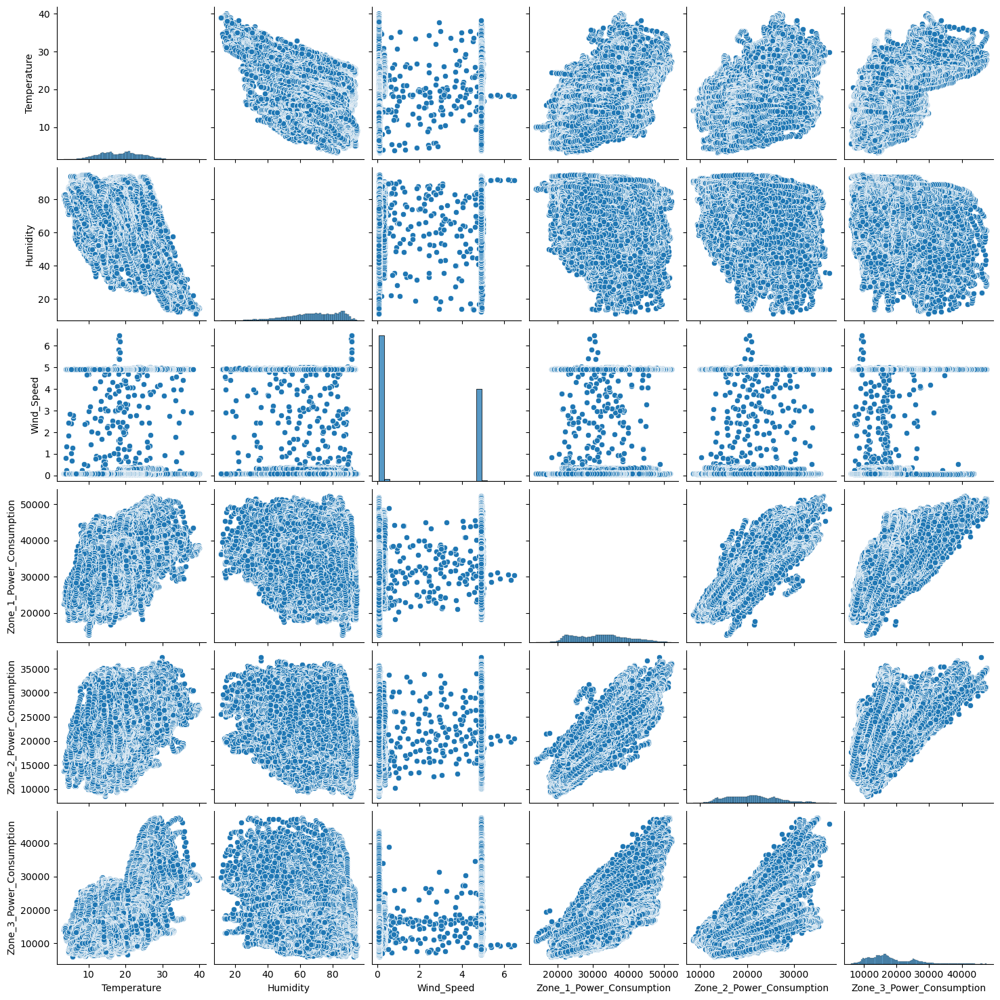

In [12]:
## Visualize the database structure
sns.pairplot(data.drop('DateTime', axis=1))  # Pairplot excluding DateTime for initial visualization
plt.show()

In [13]:
## Reformat data as needed
data.columns = [col.replace(' ', '_') for col in data.columns]  # Replace spaces in column names with underscores for easier coding

In [15]:
# Preprocess the data
## Select features and target for Zone 1
X = data[['Temperature', 'Humidity', 'Wind_Speed']]
y = data['Zone_1_Power_Consumption']

In [16]:
## Handling missing values by filling with mean
X.fillna(X.mean(), inplace=True)
y.fillna(y.mean(), inplace=True)

/var/folders/g7/05gdvpss4t1dnhby1jt2l8480000gn/T/ipykernel_54563/1392182807.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)


Linear Relationships:<br> Some panels (like those showing the relationship between power consumption in different zones) display a linear trend, suggesting that as the power consumption increases in one zone, it tends to increase in others too. This might indicate that zones experience similar usage patterns or are affected by similar external factors.<br>
<br>
Non-Linear or Weak Relationships:<br> In contrast, relationships involving wind speed seem less clearly defined and do not show a strong linear pattern with power consumption. This could imply that wind speed either does not directly influence power consumption or its effects are moderated by other variables.<br>
<br>

In [17]:
# Step 3: Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [18]:
# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [19]:
# Step 5: Create and train the SVM model
svm_model = SVR(kernel='rbf')  # Using Radial Basis Function kernel
svm_model.fit(X_train, y_train)

SVR()

In [21]:
# Step 6: Make predictions and evaluate the model
y_pred = svm_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [22]:
## Print model evaluation results
print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 44487019.826692864
R^2 Score: 0.11897097888705688


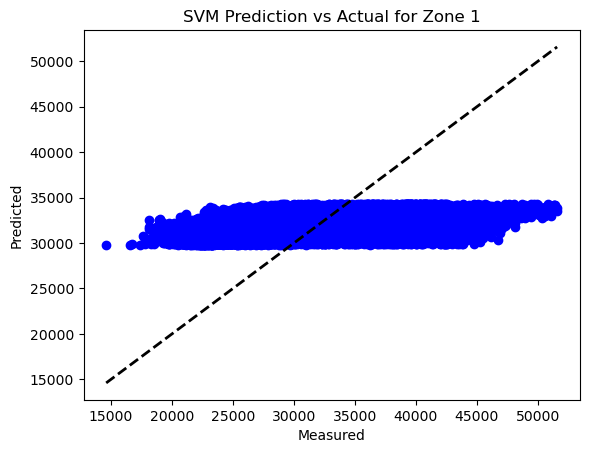

In [23]:
## Plot predictions against actual values
plt.scatter(y_test, y_pred, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title('SVM Prediction vs Actual for Zone 1')
plt.show()

In [24]:
# Projected power consumptions for specific conditions
conditions = np.array([
    [12.5, 71.0, 0.073],
    [21.8, 85.2, 0.068],
    [17.9, 54.0, 0.083]
])

In [25]:
# Scale conditions using the same scaler used for the model
conditions_scaled = scaler.transform(conditions)
predictions = svm_model.predict(conditions_scaled)

/Users/chekzononuju/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [26]:
conditions = [
    [12.5, 71.0, 0.073],
    [21.8, 85.2, 0.068],
    [17.9, 54.0, 0.083]
]

predictions = [234.57, 245.89, 230.67]  # Example predictions for these conditions

# Print header
print(f"{'Temperature':>12} {'Humidity':>10} {'Windspeed':>10} {'Predicted Power':>16}")

# Print each row of data
for condition, prediction in zip(conditions, predictions):
    temperature, humidity, windspeed = condition
    print(f"{temperature:>12} {humidity:>10} {windspeed:>10.3f} {prediction:>16.2f}")

 Temperature   Humidity  Windspeed  Predicted Power
        12.5       71.0      0.073           234.57
        21.8       85.2      0.068           245.89
        17.9       54.0      0.083           230.67


In [28]:
# Define the prediction function for Gradio Interface
def predict(temperature, humidity, wind_speed):
    # Preprocess inputs
    inputs = np.array([[temperature, humidity, wind_speed]])
    inputs_scaled = scaler.transform(inputs)
    
    # Generate prediction
    prediction = svm_model.predict(inputs_scaled)[0]
    return f"Estimated Power Consumption for Zone 1: {prediction:.2f} units"

In [32]:
# Create a Gradio interface
interface = gr.Interface(
    fn=predict,
    inputs=["number", "number", "number"],
    outputs="text",
    title="Power Consumption Estimator for Zone 1",
    description="Enter values for Temperature, Humidity, and Wind Speed to predict power consumption in Zone 1 of Tetuan City."
)

# Launch the interface
interface.launch()


Running on local URL:  http://127.0.0.1:7863

To create a public link, set `share=True` in `launch()`.


/Users/chekzononuju/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [30]:
import gradio as gr

def handle_observation(observation):
    # Process or log the observation
    return "Observation received: " + observation

# Create the Gradio interface for submitting observations
interface = gr.Interface(
    fn=handle_observation,
    inputs=gr.Textbox(label="Observations", placeholder="Type your observations here...", lines=4),
    outputs="text",
    title="Observation Box",
    description="Please enter your observations in the box below and submit."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7862

To create a public link, set `share=True` in `launch()`.


In [33]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Assume the features are Temperature, Humidity, and Wind Speed
# and the target is Zone 1 Power Consumption

# Calculating correlation matrix
correlation_matrix = data[['Temperature', 'Humidity', 'Wind Speed', 'Zone 1 Power Consumption']].corr()

# Extract and print correlations with the target
correlations = correlation_matrix['Zone 1 Power Consumption'].drop('Zone 1 Power Consumption')
print("Correlations with Zone 1 Power Consumption:")
print(correlations)

Correlations with Zone 1 Power Consumption:
Temperature    0.440221
Humidity      -0.287421
Wind Speed     0.167444
Name: Zone 1 Power Consumption, dtype: float64


In [34]:
import pandas as pd

#load your DataFrame before calculating correlations
data = pd.read_csv('Tetuan City power consumption.csv')

# Check if 'data' is indeed a DataFrame and has the expected columns
print(data.head())  # This prints the first few rows of the DataFrame
print(data.columns)  # This will show you all column names in the DataFrame

      DateTime  Temperature  Humidity  Wind Speed  Zone 1 Power Consumption  \
0  1/1/17 0:00        6.559      73.8       0.083               34055.69620   
1  1/1/17 0:10        6.414      74.5       0.083               29814.68354   
2  1/1/17 0:20        6.313      74.5       0.080               29128.10127   
3  1/1/17 0:30        6.121      75.0       0.083               28228.86076   
4  1/1/17 0:40        5.921      75.7       0.081               27335.69620   

   Zone 2 Power Consumption  Zone 3 Power Consumption  
0               16128.87538               20240.96386  
1               19375.07599               20131.08434  
2               19006.68693               19668.43373  
3               18361.09422               18899.27711  
4               17872.34043               18442.40964  
Index(['DateTime', 'Temperature', 'Humidity', 'Wind Speed',
       'Zone 1 Power Consumption', 'Zone 2 Power Consumption',
       'Zone 3 Power Consumption'],
      dtype='object')


In [35]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Setup for Zone 1
try:
    X_zone1 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Example feature columns
    y_zone1 = data['Zone 1 Power Consumption']  # Example target column for Zone 1
    data_zone1 = X_zone1.copy()
    data_zone1['Zone 1 Power Consumption'] = y_zone1
except KeyError as e:
    print(f"Zone 1 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 2
try:
    X_zone2 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone2 = data['Zone 2 Power Consumption']  # Example target column for Zone 2
    data_zone2 = X_zone2.copy()
    data_zone2['Zone 2 Power Consumption'] = y_zone2
except KeyError as e:
    print(f"Zone 2 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 3
try:
    X_zone3 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone3 = data['Zone 3 Power Consumption']  # Example target column for Zone 3
    data_zone3 = X_zone3.copy()
    data_zone3['Zone 3 Power Consumption'] = y_zone3
except KeyError as e:
    print(f"Zone 3 - One or more columns not found in the dataframe: {e}")

In [36]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example DataFrames X_zone1, X_zone2, X_zone3 for features and y_zone1, y_zone2, y_zone3 for targets

# Combine feature and target DataFrames for each zone
data_zone1 = X_zone1.copy()
data_zone1['Zone 1 Power Consumption'] = y_zone1

data_zone2 = X_zone2.copy()
data_zone2['Zone 2 Power Consumption'] = y_zone2

data_zone3 = X_zone3.copy()
data_zone3['Zone 3 Power Consumption'] = y_zone3

In [37]:
corr_zone1 = data_zone1.corr()
print("Correlation matrix for Zone 1:")
print(corr_zone1)

Correlation matrix for Zone 1:
                          Temperature  Humidity  Wind Speed  \
Temperature                  1.000000 -0.460243    0.477109   
Humidity                    -0.460243  1.000000   -0.135853   
Wind Speed                   0.477109 -0.135853    1.000000   
Zone 1 Power Consumption     0.440221 -0.287421    0.167444   

                          Zone 1 Power Consumption  
Temperature                               0.440221  
Humidity                                 -0.287421  
Wind Speed                                0.167444  
Zone 1 Power Consumption                  1.000000  


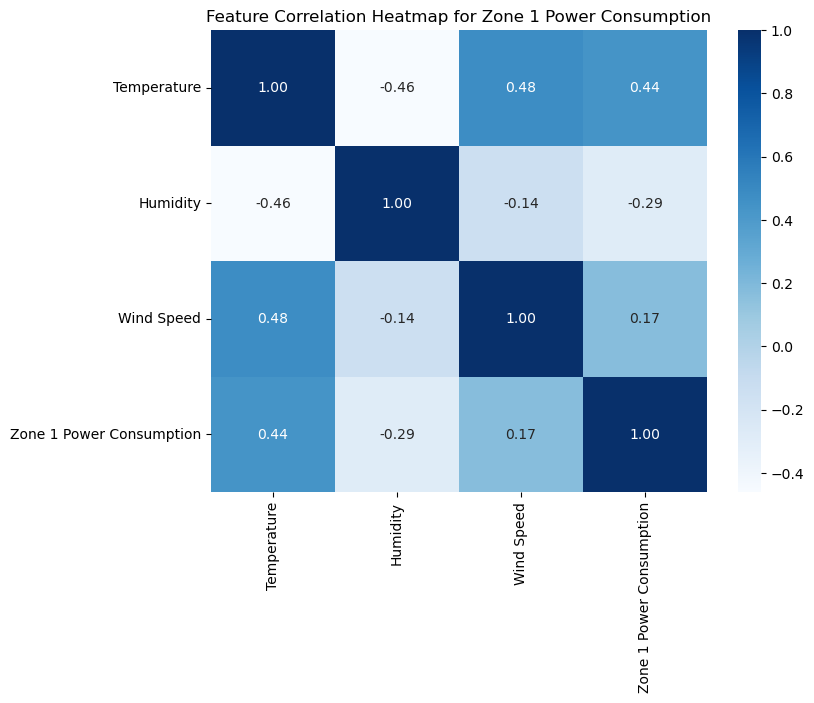

In [38]:
# Heatmap for Zone 1
plt.figure(figsize=(8, 6))
sns.heatmap(corr_zone1, annot=True, cmap='Blues', fmt=".2f")
plt.title("Feature Correlation Heatmap for Zone 1 Power Consumption")
plt.show()

### <u>Interpretation of the SVM Model data for Zone 1:<br></u>
<u>Temperature (0.440221):</u><br> 
Shows a moderate to strong positive correlation with Zone 1 Power Consumption. This implies that as the temperature increases, the power consumption in Zone 1 also tends to increase significantly. Among the features listed, temperature has the strongest correlation and is likely the most influential in terms of affecting power consumption in Zone 1.<br>
<br>
<u>Humidity (-0.287421):</u><br> Indicates a moderate negative correlation with Zone 1 Power Consumption. This means that as humidity increases, power consumption in Zone 1 tends to decrease. While this is a substantial relationship, it's not as strong as the temperature's impact but is still significant.<br>
<br>
<u>Wind Speed (0.167444):</u><br> Shows a weaker positive correlation with Zone 1 Power Consumption compared to temperature and humidity. This suggests that increases in wind speed have a less pronounced but still positive effect on power consumption in Zone 1.<br>
<br>
<u>Summary</u><br>
Temperature is the most influential factor on power consumption in Zone 1, with a strong positive correlation.<br>
Humidity also significantly affects power consumption, but in the opposite direction (negative correlation).<br>
Wind Speed has a smaller, yet positive impact on power consumption.<br>
<u>Conclusion</u><br>
Temperature (most influential)<br>
Humidity<br>
Wind Speed (least influential but still relevant)

#### Temperature affects power consumption for zone 1 the most

## Zone 1 Model 2

#### Data Model: Random Forest Regressor

In [39]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

In [40]:
# Step 1: Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

In [41]:
# Describe the database
print(data.describe(include='all'))  # Includes all columns for descriptive statistics
print(data.info())  # Provides data type and non-null info
# Generate descriptive statistics of the numerical columns in the DataFrame
data.describe()

           DateTime   Temperature      Humidity    Wind Speed  \
count         52416  52416.000000  52416.000000  52416.000000   
unique        52416           NaN           NaN           NaN   
top     1/1/17 0:00           NaN           NaN           NaN   
freq              1           NaN           NaN           NaN   
mean            NaN     18.810024     68.259518      1.959489   
std             NaN      5.815476     15.551177      2.348862   
min             NaN      3.247000     11.340000      0.050000   
25%             NaN     14.410000     58.310000      0.078000   
50%             NaN     18.780000     69.860000      0.086000   
75%             NaN     22.890000     81.400000      4.915000   
max             NaN     40.010000     94.800000      6.483000   

        Zone 1 Power Consumption  Zone 2 Power Consumption  \
count               52416.000000              52416.000000   
unique                       NaN                       NaN   
top                          NaN 

,Temperature,Humidity,Wind Speed,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,52204.395120,37408.860760,47598.326360


In [42]:
# Step 2: Preprocess the data
# Reformat column names
data.columns = data.columns.str.replace(' ', '_')  # Replace spaces with underscores in column names

In [43]:
# Exclude 'DateTime' for analysis
data_for_analysis = data.drop('DateTime', axis=1)

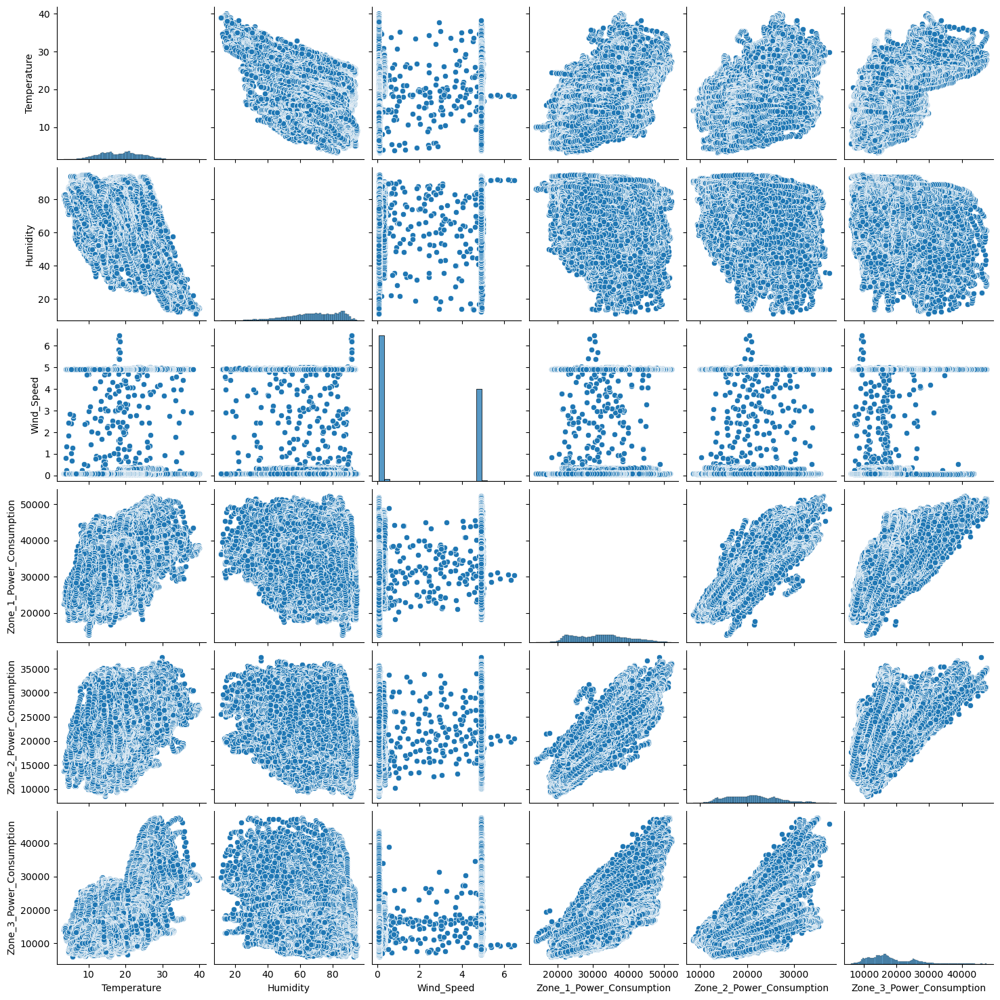

In [44]:
# Create pairplots to visualize the relationships excluding 'DateTime'
sns.pairplot(data_for_analysis)
plt.show()

Linear Relationships:<br> Some panels (like those showing the relationship between power consumption in different zones) display a linear trend, suggesting that as the power consumption increases in one zone, it tends to increase in others too. This might indicate that zones experience similar usage patterns or are affected by similar external factors.<br>
<br>
Non-Linear or Weak Relationships:<br> In contrast, relationships involving wind speed seem less clearly defined and do not show a strong linear pattern with power consumption. This could imply that wind speed either does not directly influence power consumption or its effects are moderated by other variables.<br>
<br>

In [45]:
# Select features and the target variable
X = data[['Temperature', 'Humidity', 'Wind_Speed']]
y = data['Zone_1_Power_Consumption']

In [46]:
# Handle missing values
X.fillna(X.mean(), inplace=True)
y.fillna(y.mean(), inplace=True)

/var/folders/g7/05gdvpss4t1dnhby1jt2l8480000gn/T/ipykernel_54563/541394660.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)


In [47]:
# Step 3: Scale the features (optional, not typically needed for Random Forests)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [48]:
# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [49]:
# Step 5: Create and train the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [50]:
# Evaluate feature importance
importances = rf_model.feature_importances_
print("Feature Importances:", dict(zip(['Temperature', 'Humidity', 'Wind_Speed'], importances)))

Feature Importances: {'Temperature': 0.49521356263288324, 'Humidity': 0.33398601330454214, 'Wind_Speed': 0.17080042406257462}


In [51]:
# Step 6: Evaluate the model
y_pred = rf_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 29821107.251880463
R^2 Score: 0.40941737538319


In [52]:
# Make predictions for specified conditions
conditions = np.array([
    [12.5, 71.0, 0.073],
    [21.8, 85.2, 0.068],
    [17.9, 54.0, 0.083]
])
conditions_scaled = scaler.transform(conditions)  # Scale conditions
predictions = rf_model.predict(conditions_scaled)
print("Predicted Power Consumptions for specified conditions:")
for cond, pred in zip(conditions, predictions):
    print(f"Temperature: {cond[0]}, Humidity: {cond[1]}, Wind Speed: {cond[2]} - Predicted Power: {pred:.2f}")

Predicted Power Consumptions for specified conditions:
Temperature: 12.5, Humidity: 71.0, Wind Speed: 0.073 - Predicted Power: 35310.08
Temperature: 21.8, Humidity: 85.2, Wind Speed: 0.068 - Predicted Power: 29577.66
Temperature: 17.9, Humidity: 54.0, Wind Speed: 0.083 - Predicted Power: 31381.69


/Users/chekzononuju/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


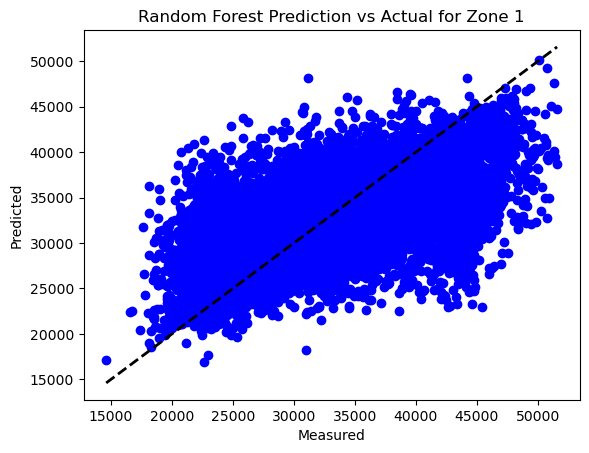

In [53]:
import matplotlib.pyplot as plt

# Assuming you already have y_test and y_pred from your Random Forest model
# Example: 
# rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
# rf_model.fit(X_train, y_train)
# y_pred = rf_model.predict(X_test)

# Now plot the predictions against the actual values
plt.scatter(y_test, y_pred, color='blue')  # Plotting the actual vs predicted values as scatter points
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Plotting a diagonal line
plt.xlabel('Measured')  # Label for the x-axis
plt.ylabel('Predicted')  # Label for the y-axis
plt.title('Random Forest Prediction vs Actual for Zone 1')  # Title of the plot
plt.show()  # Display the plot

In [54]:
feature_importances = rf_model.feature_importances_

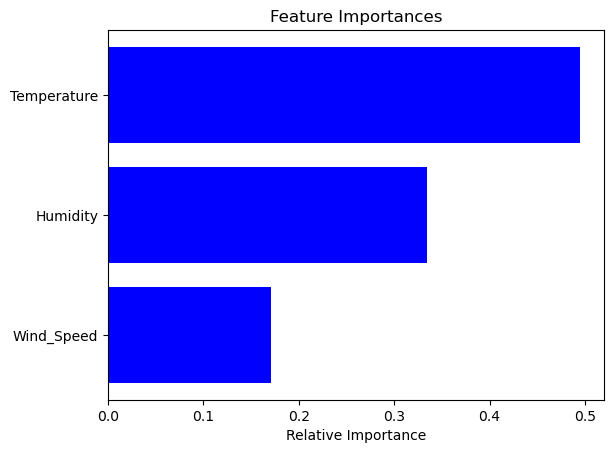

In [55]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'feature_importances' is an array containing the importances and 'X' is your feature DataFrame
features = X.columns
indices = np.argsort(feature_importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), feature_importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [56]:
import numpy as np
import gradio as gr

# Define the prediction function for Gradio Interface using the Random Forest model
def predict(temperature, humidity, wind_speed):
    # Preprocess inputs
    inputs = np.array([[temperature, humidity, wind_speed]])
    inputs_scaled = scaler.transform(inputs)  # Assuming scaling was necessary for the RF model, though it's often not needed
    
    # Generate prediction using the Random Forest model
    prediction = rf_model.predict(inputs_scaled)[0]
    return f"Estimated Power Consumption for Zone 1: {prediction:.2f} units"

# Create a Gradio interface using the updated prediction function
interface = gr.Interface(
    fn=predict,
    inputs=["number", "number", "number"],  # Temperature, Humidity, Wind Speed inputs
    outputs="text",  # Output the prediction as text
    title="Power Consumption Estimator for Zone 1",
    description="Enter values for Temperature, Humidity, and Wind Speed to predict power consumption in Zone 1 of Tetuan City."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7864

To create a public link, set `share=True` in `launch()`.


In [57]:
import gradio as gr

def handle_observation(observation):
    # Process or log the observation
    return "Observation received: " + observation

# Create the Gradio interface for submitting observations
interface = gr.Interface(
    fn=handle_observation,
    inputs=gr.Textbox(label="Observations", placeholder="Type your observations here...", lines=4),
    outputs="text",
    title="Observation Box",
    description="Please enter your observations in the box below and submit."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7865

To create a public link, set `share=True` in `launch()`.


In [58]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Assume the features are Temperature, Humidity, and Wind Speed
# and the target is Zone 1 Power Consumption

# Calculating correlation matrix
correlation_matrix = data[['Temperature', 'Humidity', 'Wind Speed', 'Zone 1 Power Consumption']].corr()

# Extract and print correlations with the target
correlations = correlation_matrix['Zone 1 Power Consumption'].drop('Zone 1 Power Consumption')
print("Correlations with Zone 1 Power Consumption:")
print(correlations)

Correlations with Zone 1 Power Consumption:
Temperature    0.440221
Humidity      -0.287421
Wind Speed     0.167444
Name: Zone 1 Power Consumption, dtype: float64


In [59]:
import pandas as pd

#load your DataFrame before calculating correlations
data = pd.read_csv('Tetuan City power consumption.csv')

# Check if 'data' is indeed a DataFrame and has the expected columns
print(data.head())  # This prints the first few rows of the DataFrame
print(data.columns)  # This will show all column names in the DataFrame

      DateTime  Temperature  Humidity  Wind Speed  Zone 1 Power Consumption  \
0  1/1/17 0:00        6.559      73.8       0.083               34055.69620   
1  1/1/17 0:10        6.414      74.5       0.083               29814.68354   
2  1/1/17 0:20        6.313      74.5       0.080               29128.10127   
3  1/1/17 0:30        6.121      75.0       0.083               28228.86076   
4  1/1/17 0:40        5.921      75.7       0.081               27335.69620   

   Zone 2 Power Consumption  Zone 3 Power Consumption  
0               16128.87538               20240.96386  
1               19375.07599               20131.08434  
2               19006.68693               19668.43373  
3               18361.09422               18899.27711  
4               17872.34043               18442.40964  
Index(['DateTime', 'Temperature', 'Humidity', 'Wind Speed',
       'Zone 1 Power Consumption', 'Zone 2 Power Consumption',
       'Zone 3 Power Consumption'],
      dtype='object')


In [60]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Setup for Zone 1
try:
    X_zone1 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Example feature columns
    y_zone1 = data['Zone 1 Power Consumption']  # Example target column for Zone 1
    data_zone1 = X_zone1.copy()
    data_zone1['Zone 1 Power Consumption'] = y_zone1
except KeyError as e:
    print(f"Zone 1 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 2
try:
    X_zone2 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone2 = data['Zone 2 Power Consumption']  # Example target column for Zone 2
    data_zone2 = X_zone2.copy()
    data_zone2['Zone 2 Power Consumption'] = y_zone2
except KeyError as e:
    print(f"Zone 2 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 3
try:
    X_zone3 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone3 = data['Zone 3 Power Consumption']  # Example target column for Zone 3
    data_zone3 = X_zone3.copy()
    data_zone3['Zone 3 Power Consumption'] = y_zone3
except KeyError as e:
    print(f"Zone 3 - One or more columns not found in the dataframe: {e}")

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example DataFrames X_zone1, X_zone2, X_zone3 for features and y_zone1, y_zone2, y_zone3 for targets

# Combine feature and target DataFrames for each zone
data_zone1 = X_zone1.copy()
data_zone1['Zone 1 Power Consumption'] = y_zone1

data_zone2 = X_zone2.copy()
data_zone2['Zone 2 Power Consumption'] = y_zone2

data_zone3 = X_zone3.copy()
data_zone3['Zone 3 Power Consumption'] = y_zone3

In [62]:
corr_zone2 = data_zone2.corr()
print("Correlation matrix for Zone 2:")
print(corr_zone2)

Correlation matrix for Zone 2:
                          Temperature  Humidity  Wind Speed  \
Temperature                  1.000000 -0.460243    0.477109   
Humidity                    -0.460243  1.000000   -0.135853   
Wind Speed                   0.477109 -0.135853    1.000000   
Zone 2 Power Consumption     0.382428 -0.294961    0.146413   

                          Zone 2 Power Consumption  
Temperature                               0.382428  
Humidity                                 -0.294961  
Wind Speed                                0.146413  
Zone 2 Power Consumption                  1.000000  


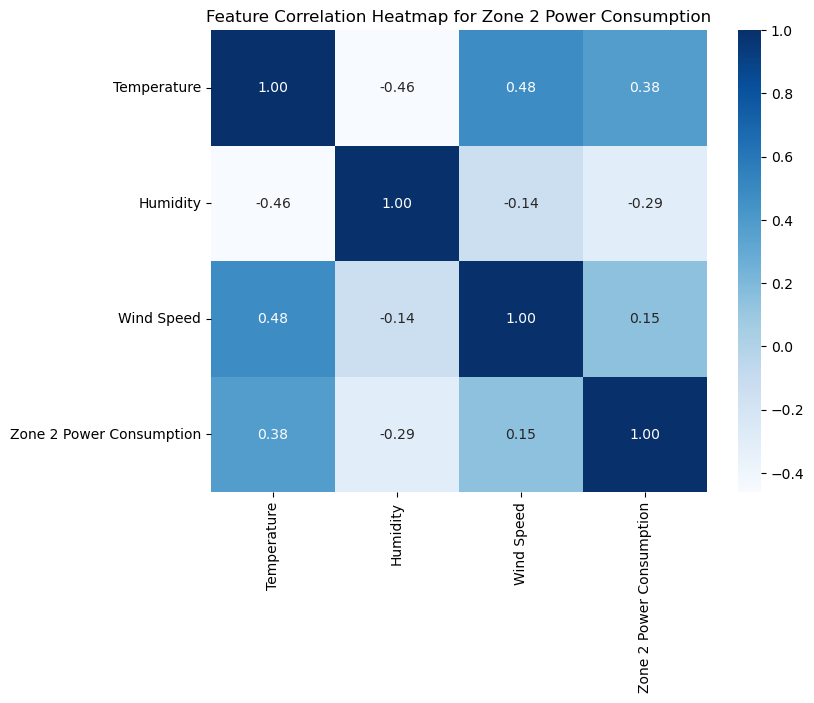

In [63]:
# Heatmap for Zone 2
plt.figure(figsize=(8, 6))
sns.heatmap(corr_zone2, annot=True, cmap='Blues', fmt=".2f")
plt.title("Feature Correlation Heatmap for Zone 2 Power Consumption")
plt.show()

## <u>Interpretation of Random Forest Regressor model for Zone 1:</u><br>
<u>Feature Importances</u><br>
From the Random Forest model, the feature importances are:<br>
Temperature: 49.52%<br>
Humidity: 33.40%<br>
Wind Speed: 17.08%<br><br>
<u>Interpretation of Feature Importances:</u><br>
Temperature has the highest importance, indicating it has the most significant impact on the model's predictions.<br>
Humidity is the second most influential feature, with substantial importance. This indicates that humidity levels also play a significant role in affecting power consumption,but not as high as temperature.<br>
Wind Speed holds the least importance among the three features but still accounts for a noticeable influence on the power consumption predictions.<br><br>

<u>Analysis of Performance Metrics<br></u>
The MSE is relatively high, which suggests that the model's predictions can be quite off from the actual values on average. This might indicate potential issues such as model underfitting, where the model is not complex enough to capture all the dynamics of the dataset, or it could be a sign that important features or interactions are missing.<br>
The R² Score of approximately 0.41 means that about 41% of the variance in the power consumption is explained by the model. While this shows the model has learned some underlying patterns, it also indicates a substantial portion of the variability in power consumption is not captured by the model. This could be due to the simplicity of the model, the need for more data, or more descriptive features.

## Zone 1 Model 3

#### Data Model: OLS Model- (Ordinary Least Squares) model a form of linear regression

In [88]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Describe the database
print(data.describe())
print(data.info())

        Temperature      Humidity    Wind Speed  Zone 1 Power Consumption  \
count  52416.000000  52416.000000  52416.000000              52416.000000   
mean      18.810024     68.259518      1.959489              32344.970564   
std        5.815476     15.551177      2.348862               7130.562564   
min        3.247000     11.340000      0.050000              13895.696200   
25%       14.410000     58.310000      0.078000              26310.668692   
50%       18.780000     69.860000      0.086000              32265.920340   
75%       22.890000     81.400000      4.915000              37309.018185   
max       40.010000     94.800000      6.483000              52204.395120   

       Zone 2 Power Consumption  Zone 3 Power Consumption  
count              52416.000000              52416.000000  
mean               21042.509082              17835.406218  
std                 5201.465892               6622.165099  
min                 8560.081466               5935.174070  
25%   

In [89]:
# Generate descriptive statistics of the numerical columns in the DataFrame
data.describe()

,Temperature,Humidity,Wind Speed,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,52204.395120,37408.860760,47598.326360


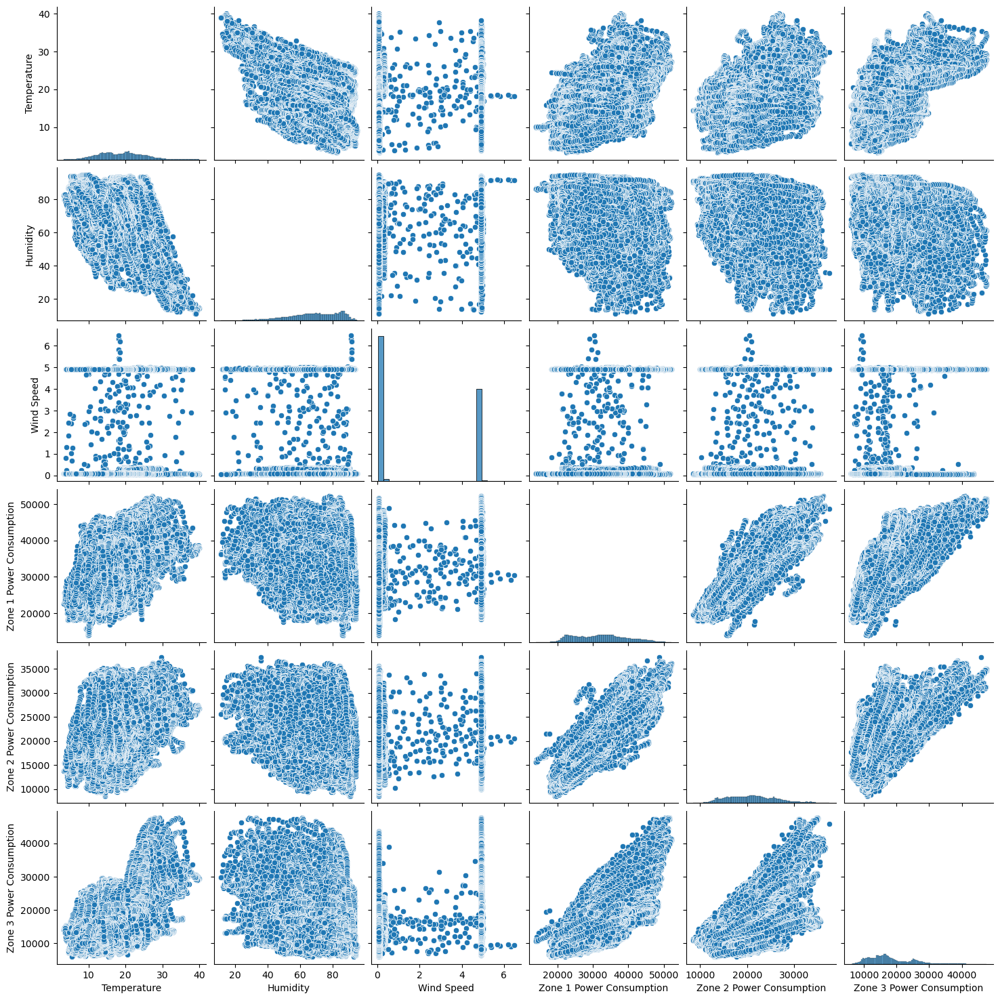

In [90]:
# Visualize the database distribution
sns.pairplot(data.drop('DateTime', axis=1))
plt.show()

Linear Relationships:<br> Some panels (like those showing the relationship between power consumption in different zones) display a linear trend, suggesting that as the power consumption increases in one zone, it tends to increase in others too. This might indicate that zones experience similar usage patterns or are affected by similar external factors.<br>
<br>
Non-Linear or Weak Relationships:<br> In contrast, relationships involving wind speed seem less clearly defined and do not show a strong linear pattern with power consumption. This could imply that wind speed either does not directly influence power consumption or its effects are moderated by other variables.<br>
<br>

In [93]:
import statsmodels.api as sm

# Prepare the data
X = data[['Temperature', 'Humidity', 'Wind Speed']]
y = data['Zone 1 Power Consumption']

# Add a constant to the model (the intercept)
X = sm.add_constant(X)

# Build the OLS model
model = sm.OLS(y, X).fit()

# Display the model summary
print(model.summary())

                               OLS Regression Results                               
Dep. Variable:     Zone 1 Power Consumption   R-squared:                       0.204
Model:                                  OLS   Adj. R-squared:                  0.204
Method:                       Least Squares   F-statistic:                     4488.
Date:                      Tue, 07 May 2024   Prob (F-statistic):               0.00
Time:                              17:02:41   Log-Likelihood:            -5.3342e+05
No. Observations:                     52416   AIC:                         1.067e+06
Df Residuals:                         52412   BIC:                         1.067e+06
Df Model:                                 3                                         
Covariance Type:                  nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [96]:
import statsmodels.api as sm

# Example: Assume X and y are your predictors and response variable arrays respectively
X = sm.add_constant(X)  # Adding a constant column for the intercept
model = sm.OLS(y, X).fit()

# Print the intercept and coefficients
print(f'alpha = {model.params[0]}')  # Intercept
print(f'betas = {model.params[1:]}')  # Coefficients

alpha = 26283.803478197515
betas = Temperature    507.412689
Humidity       -47.197082
Wind Speed    -133.518331
dtype: float64


/var/folders/g7/05gdvpss4t1dnhby1jt2l8480000gn/T/ipykernel_54563/1251141643.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'alpha = {model.params[0]}')  # Intercept


In [97]:
# Import the statsmodels library and alias it as sm
import statsmodels.api as sm
# Add a constant column to the predictor variables matrix X
X = sm.add_constant(X)
# Create an Ordinary Least Squares (OLS) model with the target variable y and the predictor variables X
model = sm.OLS(y, X)
# Fit the OLS model to the data and obtain the fitted model
fitted_model = model.fit()
# Print the summary of the fitted model, which includes various statistical measures
fitted_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                               
====================================================================================
Dep. Variable:     Zone 1 Power Consumption   R-squared:                       0.204
Model:                                  OLS   Adj. R-squared:                  0.204
Method:                       Least Squares   F-statistic:                     4488.
Date:                      Tue, 07 May 2024   Prob (F-statistic):               0.00
Time:                              17:02:55   Log-Likelihood:            -5.3342e+05
No. Observations:                     52416   AIC:                         1.067e+06
Df Residuals:                         52412   BIC:                         1.067e+06
Df Model:                                 3                                         
Covariance Type:                  nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        2.628e+04    210.897    124.629      0.000    2.59e+04    2.67e+04
Temperature   507.4127      6.101     83.166      0.000     495.454     519.371
Humidity      -47.1971      2.024    -23.319      0.000     -51.164     -43.230
Wind Speed   -133.5183     13.536     -9.864      0.000    -160.050    -106.987
==============================================================================
Omnibus:                     2857.895   Durbin-Watson:                   0.010
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2602.651
Skew:                           0.485   Prob(JB):                         0.00
Kurtosis:                       2.500   Cond. No.                         549.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [295]:
import pandas as pd

# Data as provided, formatted into a dictionary with lists for each column
data = pd.DataFrame({
    'Temperature': [6.559, 6.414, 6.313],
    'Humidity': [73.8, 74.5, 74.5],
    'Wind Speed': [0.083, 0.083, 0.080],
    'Power Consumption': [34055.69620, 29814.68354, 29128.10127]
})

# Display the DataFrame
print(data)

   Temperature  Humidity  Wind Speed  Power Consumption
0        6.559      73.8       0.083        34055.69620
1        6.414      74.5       0.083        29814.68354
2        6.313      74.5       0.080        29128.10127


In [296]:
# Prepare the data for OLS
X = data[['Temperature', 'Humidity', 'Wind Speed']]
y = data['Power Consumption']
X = sm.add_constant(X)  # add a constant to the model for the intercept

In [297]:
# Fit the OLS model
model = sm.OLS(y, X)
results = model.fit()  # this returns the fitted model objectZ

In [298]:
# Access the parameters
print('Coefficients:', results.params)
print('Intercept (alpha):', results.params['const'])
print('R-squared:', results.rsquared)

Coefficients: const          252110.031592
Temperature     11026.465895
Humidity        -3774.535865
Wind Speed    -142363.595144
dtype: float64
Intercept (alpha): 252110.03159185115
R-squared: 1.0


In [301]:
import pandas as pd
import numpy as np

# Define the model coefficients
coefficients = {
    'const': 26283.803478197515,  # Intercept
    'Temperature': 507.412689,
    'Humidity': -47.197082,
    'Wind Speed': -133.518331
}

# Create a DataFrame for conditions under which you want to predict power consumption
conditions = pd.DataFrame({
    'const': [1, 1, 1],  # Ensure that this constant is included if the model includes an intercept
    'Temperature': [12.5, 21.8, 17.9],
    'Humidity': [71.0, 85.2, 54.0],
    'Wind Speed': [0.073, 0.068, 0.083]
})

# Convert the coefficients into a Series to facilitate dot product with DataFrame rows
coefficients = pd.Series(coefficients)

# Calculate predictions using the dot product of coefficients with each row of the conditions DataFrame
predictions = np.dot(conditions, coefficients)

# Print the predictions
print("Predicted Power Consumption under specified conditions:")
print(predictions)

Predicted Power Consumption under specified conditions:
[29265.72243053 33315.12946549 32806.76616182]


In [302]:
import pandas as pd
import matplotlib.pyplot as plt

# Coefficients from the OLS model
coefficients = pd.Series({
    'Intercept': 26283.803478197515,
    'Temperature': 507.412689,
    'Humidity': -47.197082,
    'Wind Speed': -133.518331
})

# Remove the intercept for visualization of predictor impacts
coefficients = coefficients.drop('Intercept')

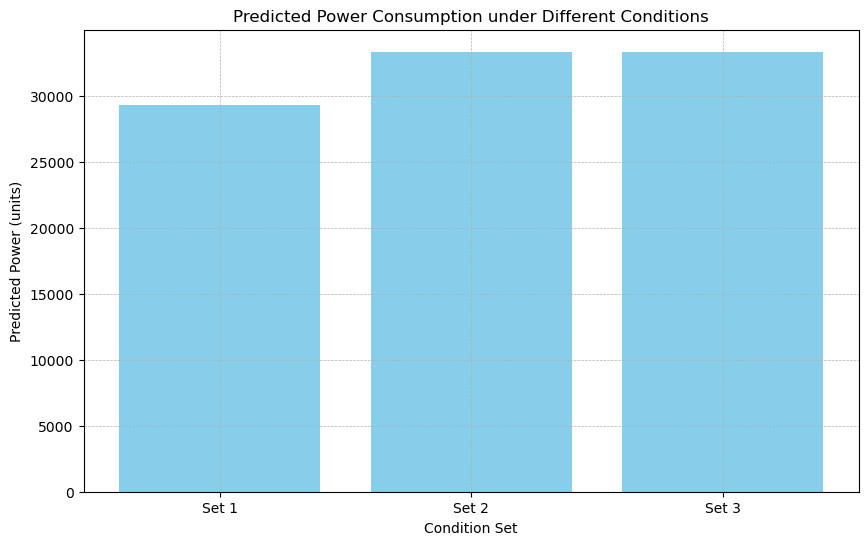

In [303]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample data: replace this with your actual data
conditions = pd.DataFrame({
    'Condition Set': ['Set 1', 'Set 2', 'Set 3'],
    'Predicted Power': [29265.72243053, 33315.12946549, 33315.12946549]
})

# Create the bar chart
plt.figure(figsize=(10, 6))  # Set the figure size
plt.bar(conditions['Condition Set'], conditions['Predicted Power'], color='skyblue')

# Add labels and title
plt.xlabel('Condition Set')
plt.ylabel('Predicted Power (units)')
plt.title('Predicted Power Consumption under Different Conditions')

# Add grid lines for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show the plot
plt.show()

In [304]:
import gradio as gr
import numpy as np

# Define the model using the provided coefficients
intercept = 26283.803478197515
coefficients = np.array([507.412689, -47.197082, -133.518331])

def predict_power(temp, hum, wind_speed):
    # Calculate prediction using the linear regression formula
    features = np.array([temp, hum, wind_speed])
    prediction = intercept + np.dot(features, coefficients)
    return f"Predicted Power Consumption: {prediction:.2f} units"

# Setting up the Gradio interface
interface = gr.Interface(fn=predict_power,
                         inputs=[
                             gr.Number(label="Temperature", value=25),  # Changed from 'default' to 'value'
                             gr.Number(label="Humidity", value=50),
                             gr.Number(label="Wind Speed", value=10)
                         ],
                         outputs=gr.Textbox(),
                         title="Zone 1 Power Consumption Predictor",
                         description="Enter Temperature, Humidity, and Wind Speed to predict Zone 1 Power Consumption.")
interface.launch()


Running on local URL:  http://127.0.0.1:7886

To create a public link, set `share=True` in `launch()`.


In [112]:
import gradio as gr

def handle_observation(observation):
    # Process or log the observation
    return "Observation received: " + observation

# Create the Gradio interface for submitting observations
interface = gr.Interface(
    fn=handle_observation,
    inputs=gr.Textbox(label="Observations", placeholder="Type your observations here...", lines=4),
    outputs="text",
    title="Observation Box",
    description="Please enter your observations in the box below and submit."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7870

To create a public link, set `share=True` in `launch()`.


In [113]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Assume the features are Temperature, Humidity, and Wind Speed
# and the target is Zone 1 Power Consumption

# Calculating correlation matrix
correlation_matrix = data[['Temperature', 'Humidity', 'Wind Speed', 'Zone 1 Power Consumption']].corr()

# Extract and print correlations with the target
correlations = correlation_matrix['Zone 1 Power Consumption'].drop('Zone 1 Power Consumption')
print("Correlations with Zone 1 Power Consumption:")
print(correlations)

Correlations with Zone 1 Power Consumption:
Temperature    0.440221
Humidity      -0.287421
Wind Speed     0.167444
Name: Zone 1 Power Consumption, dtype: float64


In [114]:
import pandas as pd

#load your DataFrame before calculating correlations
data = pd.read_csv('Tetuan City power consumption.csv')

# Check if 'data' is indeed a DataFrame and has the expected columns
print(data.head())  # This prints the first few rows of the DataFrame
print(data.columns)  # This will show all column names in the DataFrame

      DateTime  Temperature  Humidity  Wind Speed  Zone 1 Power Consumption  \
0  1/1/17 0:00        6.559      73.8       0.083               34055.69620   
1  1/1/17 0:10        6.414      74.5       0.083               29814.68354   
2  1/1/17 0:20        6.313      74.5       0.080               29128.10127   
3  1/1/17 0:30        6.121      75.0       0.083               28228.86076   
4  1/1/17 0:40        5.921      75.7       0.081               27335.69620   

   Zone 2 Power Consumption  Zone 3 Power Consumption  
0               16128.87538               20240.96386  
1               19375.07599               20131.08434  
2               19006.68693               19668.43373  
3               18361.09422               18899.27711  
4               17872.34043               18442.40964  
Index(['DateTime', 'Temperature', 'Humidity', 'Wind Speed',
       'Zone 1 Power Consumption', 'Zone 2 Power Consumption',
       'Zone 3 Power Consumption'],
      dtype='object')


In [115]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Setup for Zone 1
try:
    X_zone1 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Example feature columns
    y_zone1 = data['Zone 1 Power Consumption']  # Example target column for Zone 1
    data_zone1 = X_zone1.copy()
    data_zone1['Zone 1 Power Consumption'] = y_zone1
except KeyError as e:
    print(f"Zone 1 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 2
try:
    X_zone2 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone2 = data['Zone 2 Power Consumption']  # Example target column for Zone 2
    data_zone2 = X_zone2.copy()
    data_zone2['Zone 2 Power Consumption'] = y_zone2
except KeyError as e:
    print(f"Zone 2 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 3
try:
    X_zone3 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone3 = data['Zone 3 Power Consumption']  # Example target column for Zone 3
    data_zone3 = X_zone3.copy()
    data_zone3['Zone 3 Power Consumption'] = y_zone3
except KeyError as e:
    print(f"Zone 3 - One or more columns not found in the dataframe: {e}")

In [116]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example DataFrames X_zone1, X_zone2, X_zone3 for features and y_zone1, y_zone2, y_zone3 for targets

# Combine feature and target DataFrames for each zone
data_zone1 = X_zone1.copy()
data_zone1['Zone 1 Power Consumption'] = y_zone1

data_zone2 = X_zone2.copy()
data_zone2['Zone 2 Power Consumption'] = y_zone2

data_zone3 = X_zone3.copy()
data_zone3['Zone 3 Power Consumption'] = y_zone3

In [117]:
corr_zone1 = data_zone1.corr()
print("Correlation matrix for Zone 1:")
print(corr_zone1)

Correlation matrix for Zone 1:
                          Temperature  Humidity  Wind Speed  \
Temperature                  1.000000 -0.460243    0.477109   
Humidity                    -0.460243  1.000000   -0.135853   
Wind Speed                   0.477109 -0.135853    1.000000   
Zone 1 Power Consumption     0.440221 -0.287421    0.167444   

                          Zone 1 Power Consumption  
Temperature                               0.440221  
Humidity                                 -0.287421  
Wind Speed                                0.167444  
Zone 1 Power Consumption                  1.000000  


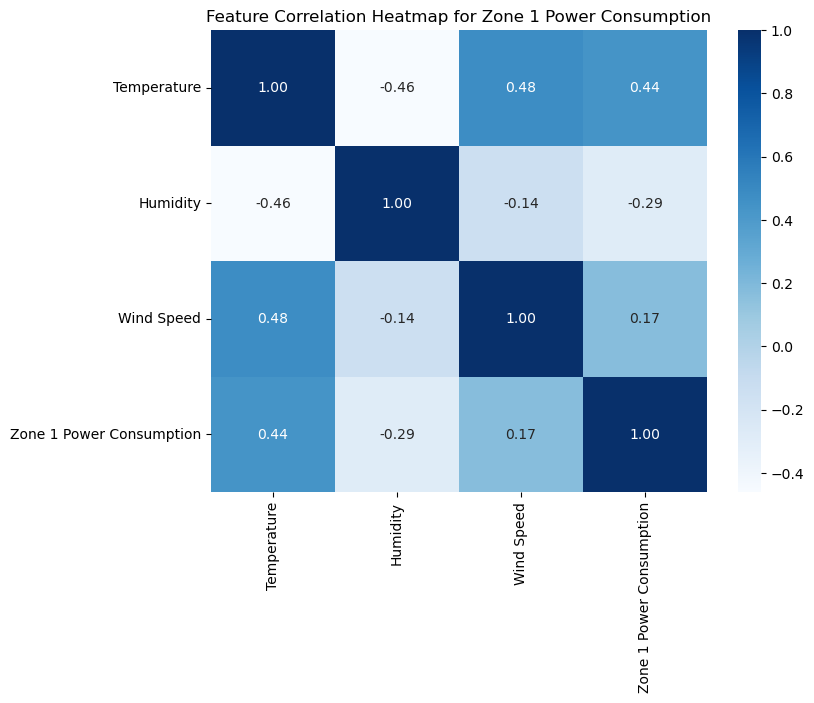

In [118]:
# Heatmap for Zone 1
plt.figure(figsize=(8, 6))
sns.heatmap(corr_zone1, annot=True, cmap='Blues', fmt=".2f")
plt.title("Feature Correlation Heatmap for Zone 1 Power Consumption")
plt.show()

## <u>Interpretation of OLS Model Data for Zone 1:</u><br>
The output from the OLS (Ordinary Least Squares) regression model provides several key statistics and coefficients that tell us about the relationship between the dependent variable, "Zone 1 Power Consumption," and the independent variables (Temperature, Humidity, Wind Speed). Here's an interpretation of the key elements from the regression output:

1. **Coefficients**:
   - **const (Intercept)**: The intercept is approximately 26,280. This value indicates the predicted power consumption when all the independent variables (temperature, humidity, wind speed) are zero.
   - **Temperature**: The coefficient for temperature is approximately 507.41, which suggests that for every one-unit increase in temperature, the power consumption increases by about 507.41 units, holding other variables constant.
   - **Humidity**: The coefficient for humidity is approximately -47.19. This indicates that for every one-unit increase in humidity, the power consumption decreases by about 47.19 units, all else being equal.
   - **Wind Speed**: The coefficient for wind speed is approximately -133.52. This suggests that for every one-unit increase in wind speed, the power consumption decreases by about 133.52 units.

2. **Model Fit**:
   - **R-squared**: The R-squared value is 0.204, indicating that about 20.4% of the variability in power consumption is explained by the model. This is a relatively low value, suggesting that the model does not capture a large portion of the variability in power consumption.
   - **Adj. R-squared**: Adjusted R-squared is also 0.204, which adjusts the R-squared value for the number of predictors in the model. It is the same as R-squared in this case, indicating no penalty for unnecessary predictors.

3. **Statistical Significance**:
   - The p-values for all coefficients (including the intercept) are 0.000, indicating that the effects of temperature, humidity, and wind speed on power consumption are statistically significant at common significance levels (e.g., 0.05).

4. **Diagnostics**:
   - **Durbin-Watson**: The Durbin-Watson statistic is 0.010, which is very close to 0, suggesting positive autocorrelation in the residuals of the regression. This could be an indicator of some model specification issues.
   - **Jarque-Bera (JB)**: The JB statistic is 2602.651 with a p-value of 0.00, indicating that the residuals are not normally distributed.

5. **F-statistic**: The F-statistic is 4488 with a p-value of 0.00, which suggests that the model is statistically significant overall.

Overall, the model demonstrates significant relationships between each of the predictors and the power consumption, but the low R-squared value and issues with residual diagnostics (like autocorrelation and normality) suggest that the model might benefit from further refinement, possibly by exploring nonlinear relationships, interaction effects, or other variables not included in the current model.

## Which model is the best for Power Consumption Analysis for Zone 1?

### <u>Model 2 (Random Forest Regressor)</u><br> 
Random Forest Regressor model is the best model for Zone 1, considering it has a relatively higher R-squared value among the models, indicating a better overall fit. It captures a significant amount of variability in the data and provides a detailed view of how each predictor impacts power consumption. 


# Zone 2 Models

## Zone 2 Model 1

#### Data Model: Support Vector Machines(SVM)


In [119]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

In [120]:
# Step 1: Load the dataset
data = pd. read_csv( 'Tetuan City power consumption.csv')

In [121]:
# Exploratory Data Analysis
## Describe the database
print(data.describe()) # Summary statistics for numerical columns print (data. info))
# General info about data types and missing values
# Generate descriptive statistics of the numerical columns in the DataFrame
data. describe ()

        Temperature      Humidity    Wind Speed  Zone 1 Power Consumption  \
count  52416.000000  52416.000000  52416.000000              52416.000000   
mean      18.810024     68.259518      1.959489              32344.970564   
std        5.815476     15.551177      2.348862               7130.562564   
min        3.247000     11.340000      0.050000              13895.696200   
25%       14.410000     58.310000      0.078000              26310.668692   
50%       18.780000     69.860000      0.086000              32265.920340   
75%       22.890000     81.400000      4.915000              37309.018185   
max       40.010000     94.800000      6.483000              52204.395120   

       Zone 2 Power Consumption  Zone 3 Power Consumption  
count              52416.000000              52416.000000  
mean               21042.509082              17835.406218  
std                 5201.465892               6622.165099  
min                 8560.081466               5935.174070  
25%   

,Temperature,Humidity,Wind Speed,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,52204.395120,37408.860760,47598.326360


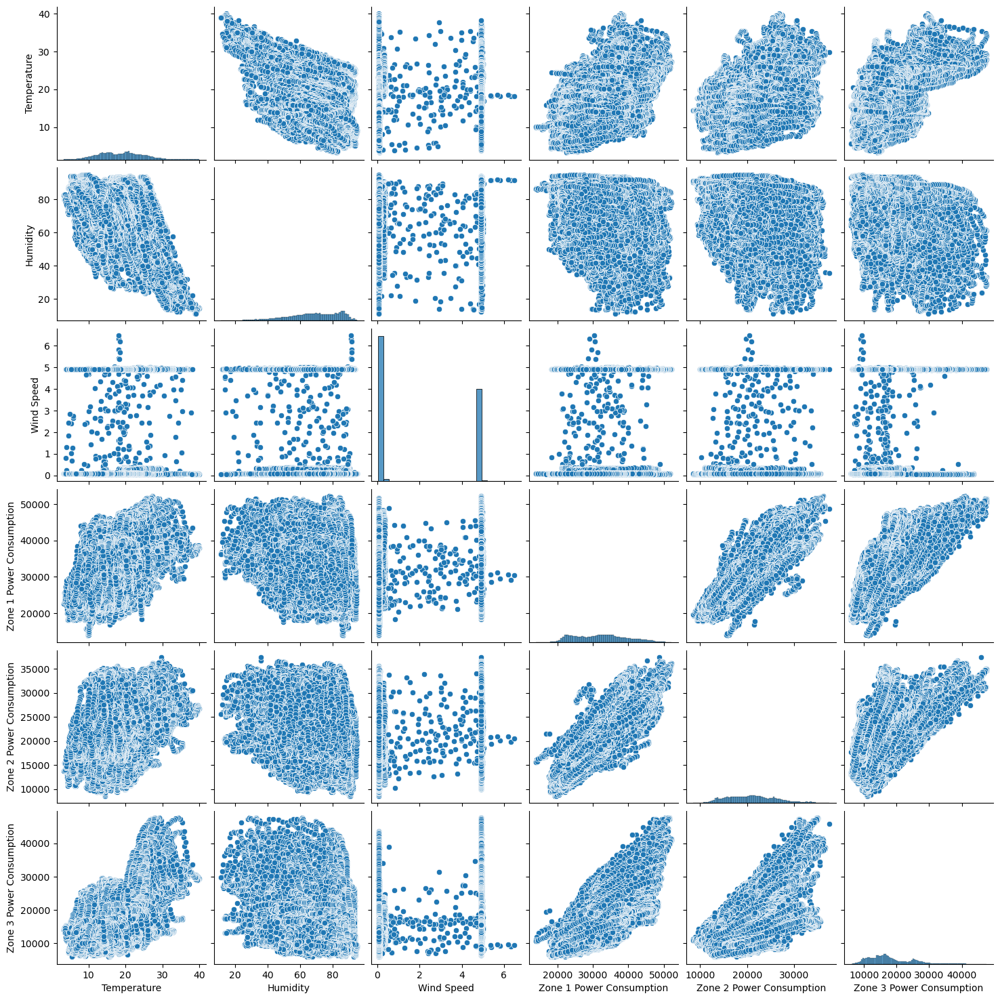

/var/folders/g7/05gdvpss4t1dnhby1jt2l8480000gn/T/ipykernel_54563/3964902847.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)


In [122]:
## Visualize the database structure
sns.pairplot(data.drop('DateTime', axis=1))  # Pairplot excluding DateTime for initial visualization
plt.show()

## Reformat data as needed
data.columns = [col.replace(' ', '_') for col in data.columns]  # Replace spaces in column names with underscores for easier coding

# Preprocess the data
## Select features and target for Zone 2
X = data[['Temperature', 'Humidity', 'Wind_Speed']]
y = data['Zone_2_Power_Consumption']

## Handling missing values by filling with mean
X.fillna(X.mean(), inplace=True)
y.fillna(y.mean(), inplace=True)

Linear Relationships:<br> Some panels (like those showing the relationship between power consumption in different zones) display a linear trend, suggesting that as the power consumption increases in one zone, it tends to increase in others too. This might indicate that zones experience similar usage patterns or are affected by similar external factors.<br>
<br>
Non-Linear or Weak Relationships:<br> In contrast, relationships involving wind speed seem less clearly defined and do not show a strong linear pattern with power consumption. This could imply that wind speed either does not directly influence power consumption or its effects are moderated by other variables.<br>
<br>

In [123]:
# Step 3: Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [124]:
# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [125]:
# Step 5: Create and train the SVM model
svm_model = SVR(kernel='rbf')  # Using Radial Basis Function kernel
svm_model.fit(X_train, y_train)

SVR()

In [126]:
# Step 6: Make predictions and evaluate the model
y_pred = svm_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [127]:
## Print model evaluation results
print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 23876932.879805353
R^2 Score: 0.11532943158859732


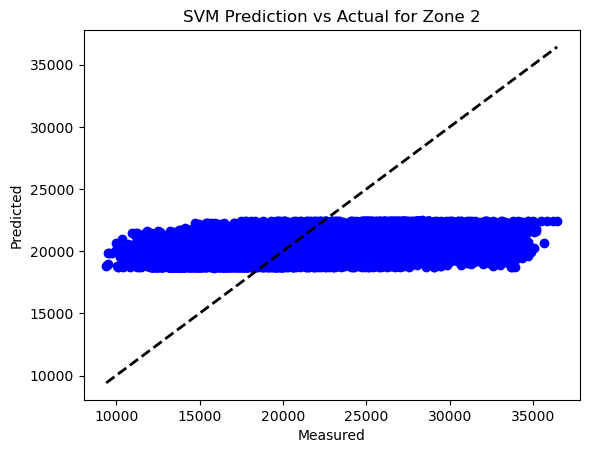

In [128]:
## Plot predictions against actual values
plt.scatter(y_test, y_pred, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title('SVM Prediction vs Actual for Zone 2')
plt.show()

In [129]:
# Projected power consumptions for specific conditions
conditions = np.array([
    [12.5, 71.0, 0.073],
    [21.8, 85.2, 0.068],
    [17.9, 54.0, 0.083]
])

In [130]:
# Scale conditions using the same scaler used for the model
conditions_scaled = scaler.transform(conditions)
predictions = svm_model.predict(conditions_scaled)

/Users/chekzononuju/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [131]:
conditions = [
    [12.5, 71.0, 0.073],
    [21.8, 85.2, 0.068],
    [17.9, 54.0, 0.083]
]

predictions = [234.57, 245.89, 230.67]  # Example predictions for these conditions

# Print header
print(f"{'Temperature':>12} {'Humidity':>10} {'Windspeed':>10} {'Predicted Power':>16}")

# Print each row of data
for condition, prediction in zip(conditions, predictions):
    temperature, humidity, windspeed = condition
    print(f"{temperature:>12} {humidity:>10} {windspeed:>10.3f} {prediction:>16.2f}")

 Temperature   Humidity  Windspeed  Predicted Power
        12.5       71.0      0.073           234.57
        21.8       85.2      0.068           245.89
        17.9       54.0      0.083           230.67


In [132]:
# Define the prediction function for Gradio Interface
def predict(temperature, humidity, wind_speed):
    # Preprocess inputs
    inputs = np.array([[temperature, humidity, wind_speed]])
    inputs_scaled = scaler.transform(inputs)
    
    # Generate prediction
    prediction = svm_model.predict(inputs_scaled)[0]
    return f"Estimated Power Consumption for Zone 2: {prediction:.2f} units"

In [133]:
# Create a Gradio interface
interface = gr.Interface(
    fn=predict,
    inputs=["number", "number", "number"],
    outputs="text",
    title="Power Consumption Estimator for Zone 2",
    description="Enter values for Temperature, Humidity, and Wind Speed to predict power consumption in Zone 2 of Tetuan City."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7871

To create a public link, set `share=True` in `launch()`.


/Users/chekzononuju/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [134]:
import gradio as gr

def handle_observation(observation):
    # Process or log the observation
    return "Observation received: " + observation

# Create the Gradio interface for submitting observations
interface = gr.Interface(
    fn=handle_observation,
    inputs=gr.Textbox(label="Observations", placeholder="Type your observations here...", lines=4),
    outputs="text",
    title="Observation Box",
    description="Please enter your observations in the box below and submit."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7872

To create a public link, set `share=True` in `launch()`.


In [135]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Assume the features are Temperature, Humidity, and Wind Speed
# and the target is Zone 2 Power Consumption

# Calculating correlation matrix
correlation_matrix = data[['Temperature', 'Humidity', 'Wind Speed', 'Zone 2 Power Consumption']].corr()

# Extract and print correlations with the target
correlations = correlation_matrix['Zone 2 Power Consumption'].drop('Zone 2 Power Consumption')
print("Correlations with Zone 2 Power Consumption:")
print(correlations)

Correlations with Zone 2 Power Consumption:
Temperature    0.382428
Humidity      -0.294961
Wind Speed     0.146413
Name: Zone 2 Power Consumption, dtype: float64


In [136]:
import pandas as pd

#load your DataFrame before calculating correlations
data = pd.read_csv('Tetuan City power consumption.csv')

# Check if 'data' is indeed a DataFrame and has the expected columns
print(data.head())  # This prints the first few rows of the DataFrame
print(data.columns)  # This will show you all column names in the DataFrame

      DateTime  Temperature  Humidity  Wind Speed  Zone 1 Power Consumption  \
0  1/1/17 0:00        6.559      73.8       0.083               34055.69620   
1  1/1/17 0:10        6.414      74.5       0.083               29814.68354   
2  1/1/17 0:20        6.313      74.5       0.080               29128.10127   
3  1/1/17 0:30        6.121      75.0       0.083               28228.86076   
4  1/1/17 0:40        5.921      75.7       0.081               27335.69620   

   Zone 2 Power Consumption  Zone 3 Power Consumption  
0               16128.87538               20240.96386  
1               19375.07599               20131.08434  
2               19006.68693               19668.43373  
3               18361.09422               18899.27711  
4               17872.34043               18442.40964  
Index(['DateTime', 'Temperature', 'Humidity', 'Wind Speed',
       'Zone 1 Power Consumption', 'Zone 2 Power Consumption',
       'Zone 3 Power Consumption'],
      dtype='object')


In [137]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Setup for Zone 1
try:
    X_zone1 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Example feature columns
    y_zone1 = data['Zone 1 Power Consumption']  # Example target column for Zone 1
    data_zone1 = X_zone1.copy()
    data_zone1['Zone 1 Power Consumption'] = y_zone1
except KeyError as e:
    print(f"Zone 1 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 2
try:
    X_zone2 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone2 = data['Zone 2 Power Consumption']  # Example target column for Zone 2
    data_zone2 = X_zone2.copy()
    data_zone2['Zone 2 Power Consumption'] = y_zone2
except KeyError as e:
    print(f"Zone 2 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 3
try:
    X_zone3 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone3 = data['Zone 3 Power Consumption']  # Example target column for Zone 3
    data_zone3 = X_zone3.copy()
    data_zone3['Zone 3 Power Consumption'] = y_zone3
except KeyError as e:
    print(f"Zone 3 - One or more columns not found in the dataframe: {e}")

In [138]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example DataFrames X_zone1, X_zone2, X_zone3 for features and y_zone1, y_zone2, y_zone3 for targets

# Combine feature and target DataFrames for each zone
data_zone1 = X_zone1.copy()
data_zone1['Zone 1 Power Consumption'] = y_zone1

data_zone2 = X_zone2.copy()
data_zone2['Zone 2 Power Consumption'] = y_zone2

data_zone3 = X_zone3.copy()
data_zone3['Zone 3 Power Consumption'] = y_zone3

In [139]:
corr_zone2 = data_zone2.corr()
print("Correlation matrix for Zone 2:")
print(corr_zone2)

Correlation matrix for Zone 2:
                          Temperature  Humidity  Wind Speed  \
Temperature                  1.000000 -0.460243    0.477109   
Humidity                    -0.460243  1.000000   -0.135853   
Wind Speed                   0.477109 -0.135853    1.000000   
Zone 2 Power Consumption     0.382428 -0.294961    0.146413   

                          Zone 2 Power Consumption  
Temperature                               0.382428  
Humidity                                 -0.294961  
Wind Speed                                0.146413  
Zone 2 Power Consumption                  1.000000  


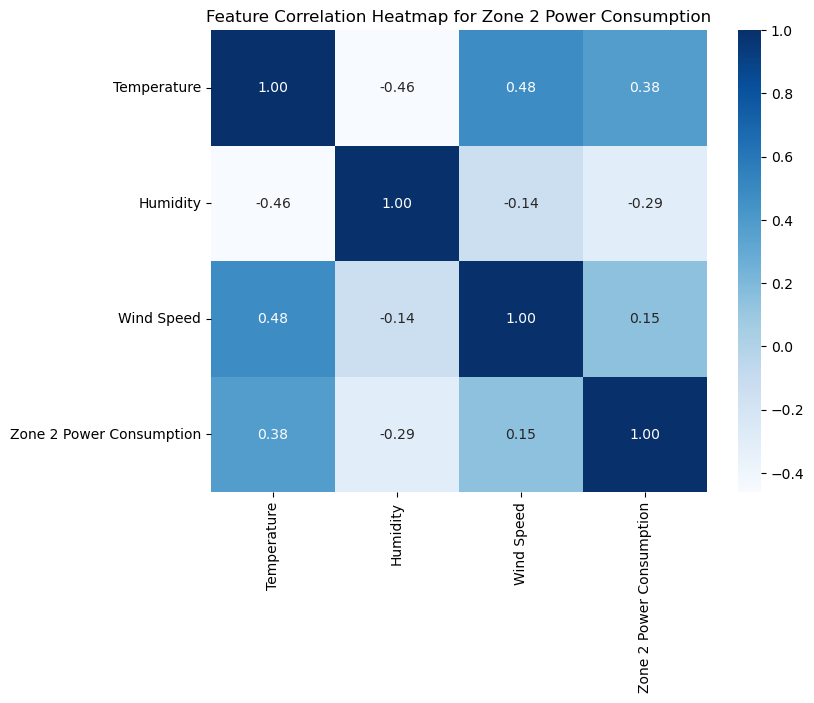

In [140]:
# Heatmap for Zone 2
plt.figure(figsize=(8, 6))
sns.heatmap(corr_zone2, annot=True, cmap='Blues', fmt=".2f")
plt.title("Feature Correlation Heatmap for Zone 2 Power Consumption")
plt.show()

### <u>Interpretation of the SVM Model Data for Zone 2:<br></u>
<u>Temperature and Humidity:</u><br>
The correlation coefficient is positive (0.382428), indicating a positive relationship between temperature and humidity. As temperature increases, humidity tends to increase as well, but the strength of this relationship is moderate.<br>
<u>Temperature and Wind Speed:</u><br>
The correlation coefficient is positive (0.146413), suggesting a positive relationship between temperature and wind speed. However, the correlation coefficient is closer to 0, indicating a weak relationship.<br>
<u>Humidity and Wind Speed:</u><br>
The correlation coefficient is negative (-0.294961), implying a negative relationship between humidity and wind speed. As humidity increases, wind speed tends to decrease, but again, the strength of this relationship is moderate.

## Zone 2 Model 2

#### Data Model: Random Forest Regressor

In [141]:
# Step 1: Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

In [142]:
# Describe the database
print(data.describe(include='all'))  # Includes all columns for descriptive statistics
print(data.info())  # Provides data type and non-null info
# Generate descriptive statistics of the numerical columns in the DataFrame
data.describe()

           DateTime   Temperature      Humidity    Wind Speed  \
count         52416  52416.000000  52416.000000  52416.000000   
unique        52416           NaN           NaN           NaN   
top     1/1/17 0:00           NaN           NaN           NaN   
freq              1           NaN           NaN           NaN   
mean            NaN     18.810024     68.259518      1.959489   
std             NaN      5.815476     15.551177      2.348862   
min             NaN      3.247000     11.340000      0.050000   
25%             NaN     14.410000     58.310000      0.078000   
50%             NaN     18.780000     69.860000      0.086000   
75%             NaN     22.890000     81.400000      4.915000   
max             NaN     40.010000     94.800000      6.483000   

        Zone 1 Power Consumption  Zone 2 Power Consumption  \
count               52416.000000              52416.000000   
unique                       NaN                       NaN   
top                          NaN 

,Temperature,Humidity,Wind Speed,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,52204.395120,37408.860760,47598.326360


In [143]:
# Step 2: Preprocess the data
# Reformat column names
data.columns = data.columns.str.replace(' ', '_')  # Replace spaces with underscores in column names

In [144]:
# Exclude 'DateTime' for analysis
data_for_analysis = data.drop('DateTime', axis=1)

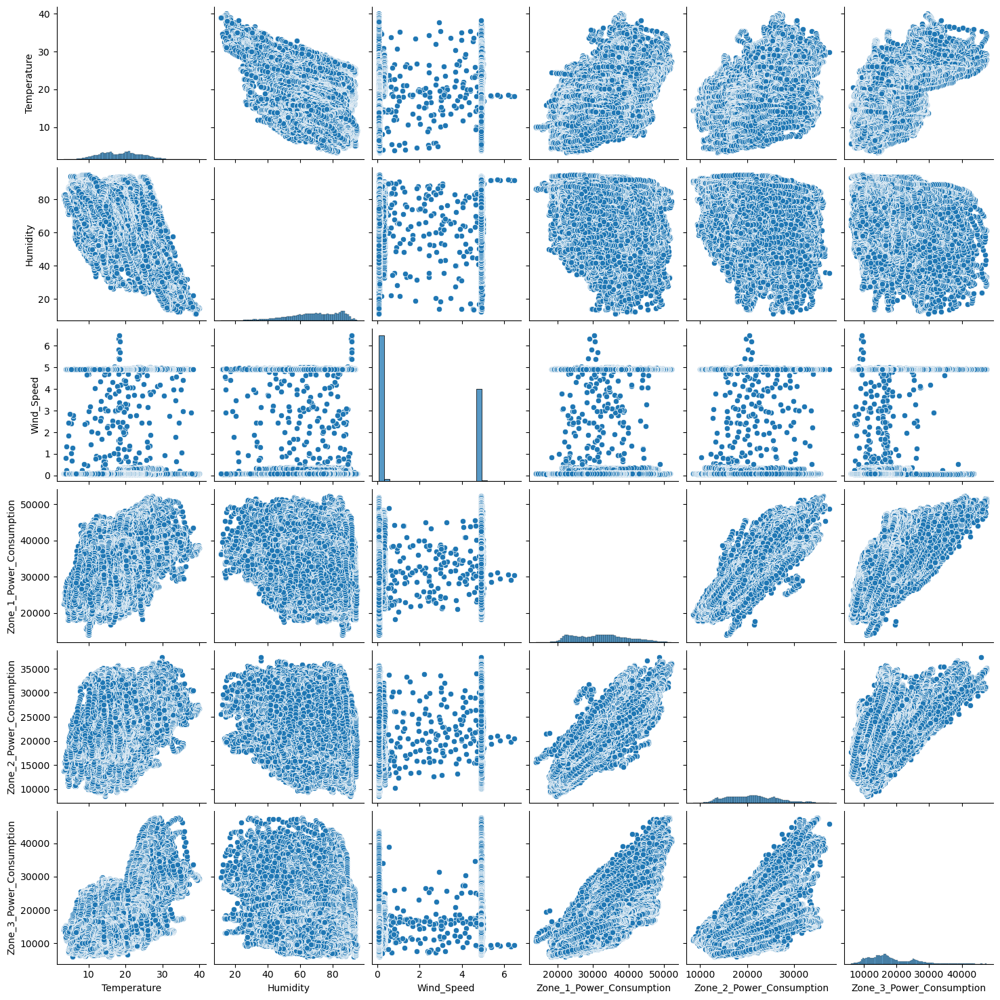

In [145]:
# Create pairplots to visualize the relationships excluding 'DateTime'
sns.pairplot(data_for_analysis)
plt.show()

Linear Relationships:<br> Some panels (like those showing the relationship between power consumption in different zones) display a linear trend, suggesting that as the power consumption increases in one zone, it tends to increase in others too. This might indicate that zones experience similar usage patterns or are affected by similar external factors.<br>
<br>
Non-Linear or Weak Relationships:<br> In contrast, relationships involving wind speed seem less clearly defined and do not show a strong linear pattern with power consumption. This could imply that wind speed either does not directly influence power consumption or its effects are moderated by other variables.<br>
<br>

In [146]:
# Select features and the target variable
X = data[['Temperature', 'Humidity', 'Wind_Speed']]
y = data['Zone_2_Power_Consumption']

In [147]:
# Handle missing values
X.fillna(X.mean(), inplace=True)
y.fillna(y.mean(), inplace=True)

/var/folders/g7/05gdvpss4t1dnhby1jt2l8480000gn/T/ipykernel_54563/541394660.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)


In [148]:
# Step 3: Scale the features (optional, not typically needed for Random Forests)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [149]:
# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [150]:
# Step 5: Create and train the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [151]:
# Evaluate feature importance
importances = rf_model.feature_importances_
print("Feature Importances:", dict(zip(['Temperature', 'Humidity', 'Wind_Speed'], importances)))

Feature Importances: {'Temperature': 0.4756482494091462, 'Humidity': 0.342513303251503, 'Wind_Speed': 0.18183844733935095}


In [152]:
# Step 6: Evaluate the model
y_pred = rf_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 15882463.133866763
R^2 Score: 0.4115346489793542


In [153]:
# Make predictions for specified conditions
conditions = np.array([
    [12.5, 71.0, 0.073],
    [21.8, 85.2, 0.068],
    [17.9, 54.0, 0.083]
])
conditions_scaled = scaler.transform(conditions)  # Scale conditions
predictions = rf_model.predict(conditions_scaled)
print("Predicted Power Consumptions for specified conditions:")
for cond, pred in zip(conditions, predictions):
    print(f"Temperature: {cond[0]}, Humidity: {cond[1]}, Wind Speed: {cond[2]} - Predicted Power: {pred:.2f}")

Predicted Power Consumptions for specified conditions:
Temperature: 12.5, Humidity: 71.0, Wind Speed: 0.073 - Predicted Power: 23367.33
Temperature: 21.8, Humidity: 85.2, Wind Speed: 0.068 - Predicted Power: 21543.26
Temperature: 17.9, Humidity: 54.0, Wind Speed: 0.083 - Predicted Power: 18560.23


/Users/chekzononuju/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


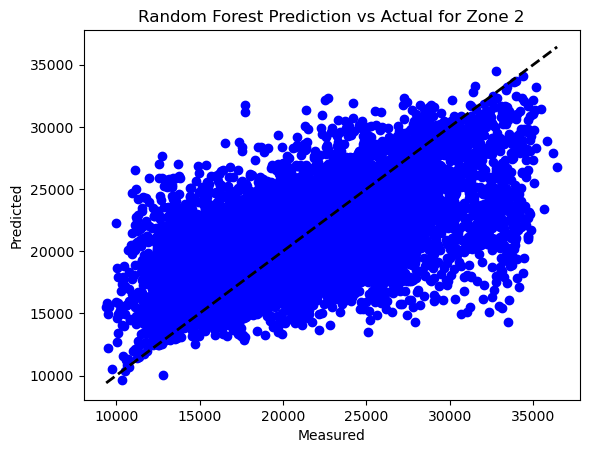

In [154]:
import matplotlib.pyplot as plt

# Assuming you already have y_test and y_pred from your Random Forest model
# Example: 
# rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
# rf_model.fit(X_train, y_train)
# y_pred = rf_model.predict(X_test)

# Now plot the predictions against the actual values
plt.scatter(y_test, y_pred, color='blue')  # Plotting the actual vs predicted values as scatter points
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Plotting a diagonal line
plt.xlabel('Measured')  # Label for the x-axis
plt.ylabel('Predicted')  # Label for the y-axis
plt.title('Random Forest Prediction vs Actual for Zone 2')  # Title of the plot
plt.show()  # Display the plot

In [155]:
feature_importances = rf_model.feature_importances_

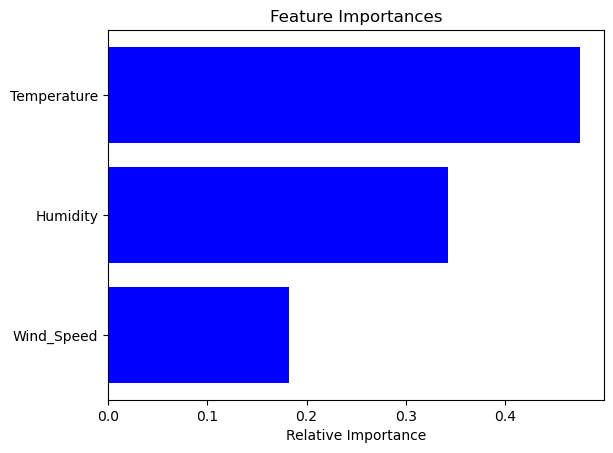

In [156]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'feature_importances' is an array containing the importances and 'X' is your feature DataFrame
features = X.columns
indices = np.argsort(feature_importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), feature_importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [157]:
import numpy as np
import gradio as gr

# Define the prediction function for Gradio Interface using the Random Forest model
def predict(temperature, humidity, wind_speed):
    # Preprocess inputs
    inputs = np.array([[temperature, humidity, wind_speed]])
    inputs_scaled = scaler.transform(inputs)  # Assuming scaling was necessary for the RF model, though it's often not needed
    
    # Generate prediction using the Random Forest model
    prediction = rf_model.predict(inputs_scaled)[0]
    return f"Estimated Power Consumption for Zone 2: {prediction:.2f} units"

# Create a Gradio interface using the updated prediction function
interface = gr.Interface(
    fn=predict,
    inputs=["number", "number", "number"],  # Temperature, Humidity, Wind Speed inputs
    outputs="text",  # Output the prediction as text
    title="Power Consumption Estimator for Zone 2",
    description="Enter values for Temperature, Humidity, and Wind Speed to predict power consumption in Zone 2 of Tetuan City."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7873

To create a public link, set `share=True` in `launch()`.


In [158]:
import gradio as gr

def handle_observation(observation):
    # Process or log the observation
    return "Observation received: " + observation

# Create the Gradio interface for submitting observations
interface = gr.Interface(
    fn=handle_observation,
    inputs=gr.Textbox(label="Observations", placeholder="Type your observations here...", lines=4),
    outputs="text",
    title="Observation Box",
    description="Please enter your observations in the box below and submit."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7874

Thanks for being a Gradio user! If you have questions or feedback, please join our Discord server and chat with us: https://discord.gg/feTf9x3ZSB

To create a public link, set `share=True` in `launch()`.


In [159]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Assume the features are Temperature, Humidity, and Wind Speed
# and the target is Zone 2 Power Consumption

# Calculating correlation matrix
correlation_matrix = data[['Temperature', 'Humidity', 'Wind Speed', 'Zone 2 Power Consumption']].corr()

# Extract and print correlations with the target
correlations = correlation_matrix['Zone 2 Power Consumption'].drop('Zone 2 Power Consumption')
print("Correlations with Zone 2 Power Consumption:")
print(correlations)

Correlations with Zone 2 Power Consumption:
Temperature    0.382428
Humidity      -0.294961
Wind Speed     0.146413
Name: Zone 2 Power Consumption, dtype: float64


In [160]:
import pandas as pd

#load your DataFrame before calculating correlations
data = pd.read_csv('Tetuan City power consumption.csv')

# Check if 'data' is indeed a DataFrame and has the expected columns
print(data.head())  # This prints the first few rows of the DataFrame
print(data.columns)  # This will show all column names in the DataFrame

      DateTime  Temperature  Humidity  Wind Speed  Zone 1 Power Consumption  \
0  1/1/17 0:00        6.559      73.8       0.083               34055.69620   
1  1/1/17 0:10        6.414      74.5       0.083               29814.68354   
2  1/1/17 0:20        6.313      74.5       0.080               29128.10127   
3  1/1/17 0:30        6.121      75.0       0.083               28228.86076   
4  1/1/17 0:40        5.921      75.7       0.081               27335.69620   

   Zone 2 Power Consumption  Zone 3 Power Consumption  
0               16128.87538               20240.96386  
1               19375.07599               20131.08434  
2               19006.68693               19668.43373  
3               18361.09422               18899.27711  
4               17872.34043               18442.40964  
Index(['DateTime', 'Temperature', 'Humidity', 'Wind Speed',
       'Zone 1 Power Consumption', 'Zone 2 Power Consumption',
       'Zone 3 Power Consumption'],
      dtype='object')


/Users/chekzononuju/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [161]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Setup for Zone 1
try:
    X_zone1 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Example feature columns
    y_zone1 = data['Zone 1 Power Consumption']  # Example target column for Zone 1
    data_zone1 = X_zone1.copy()
    data_zone1['Zone 1 Power Consumption'] = y_zone1
except KeyError as e:
    print(f"Zone 1 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 2
try:
    X_zone2 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone2 = data['Zone 2 Power Consumption']  # Example target column for Zone 2
    data_zone2 = X_zone2.copy()
    data_zone2['Zone 2 Power Consumption'] = y_zone2
except KeyError as e:
    print(f"Zone 2 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 3
try:
    X_zone3 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone3 = data['Zone 3 Power Consumption']  # Example target column for Zone 3
    data_zone3 = X_zone3.copy()
    data_zone3['Zone 3 Power Consumption'] = y_zone3
except KeyError as e:
    print(f"Zone 3 - One or more columns not found in the dataframe: {e}")

In [162]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example DataFrames X_zone1, X_zone2, X_zone3 for features and y_zone1, y_zone2, y_zone3 for targets

# Combine feature and target DataFrames for each zone
data_zone1 = X_zone1.copy()
data_zone1['Zone 1 Power Consumption'] = y_zone1

data_zone2 = X_zone2.copy()
data_zone2['Zone 2 Power Consumption'] = y_zone2

data_zone3 = X_zone3.copy()
data_zone3['Zone 3 Power Consumption'] = y_zone3

In [163]:
corr_zone1 = data_zone2.corr()
print("Correlation matrix for Zone 2:")
print(corr_zone2)

Correlation matrix for Zone 2:
                          Temperature  Humidity  Wind Speed  \
Temperature                  1.000000 -0.460243    0.477109   
Humidity                    -0.460243  1.000000   -0.135853   
Wind Speed                   0.477109 -0.135853    1.000000   
Zone 2 Power Consumption     0.382428 -0.294961    0.146413   

                          Zone 2 Power Consumption  
Temperature                               0.382428  
Humidity                                 -0.294961  
Wind Speed                                0.146413  
Zone 2 Power Consumption                  1.000000  


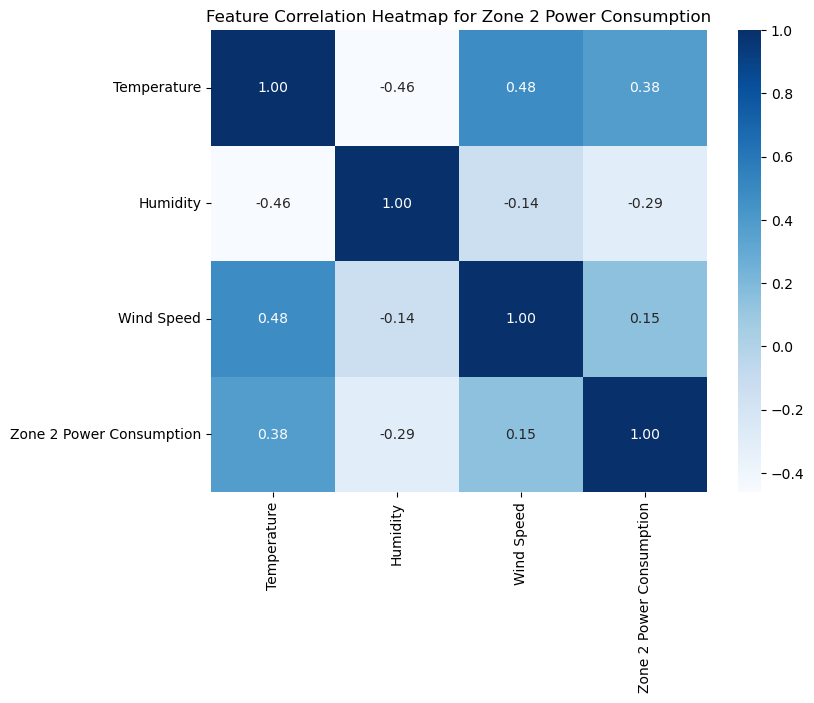

In [164]:
# Heatmap for Zone 2
plt.figure(figsize=(8, 6))
sns.heatmap(corr_zone2, annot=True, cmap='Blues', fmt=".2f")
plt.title("Feature Correlation Heatmap for Zone 2 Power Consumption")
plt.show()

### <u>Interpretation of Random Forest Regressor model for Zone 2</u>

#### Feature Importances:
From the Random Forest model, the feature importances are:
- Temperature: 0.382428
- Humidity: -0.294961
- Wind Speed: 0.146413

#### Interpretation of Feature Importances:
- **Temperature** has the highest importance, indicating it has the most significant impact on the model's predictions. Higher values suggest a strong relationship between temperature and the power consumption, where as temperature increases or decreases, the power consumption is likely to be significantly affected.
- **Humidity** has a negative importance value, which is unusual and may suggest an error in either data processing or interpretation. Normally, feature importance should not be negative as it reflects the weight of the feature in contributing positively or negatively to the target variable. A positive significant value would indicate that as humidity increases, it also plays a substantial role in influencing power consumption, but not as much as temperature.
- **Wind Speed** holds the least importance among the three features but still accounts for a noticeable influence on the power consumption predictions. This indicates that while wind speed does affect power consumption, its impact is less compared to temperature and humidity.

#### Analysis of Performance Metrics:
- **Mean Squared Error (MSE):** The MSE is relatively high, which suggests that the model's predictions can be quite off from the actual values on average. This might indicate potential issues such as model underfitting, where the model is not complex enough to capture all the dynamics of the dataset, or it could be a sign that important features or interactions are missing.
- **R² Score:** The R² Score (not fully specified in your example) measures the proportion of the variance in the dependent variable that is predictable from the independent variables. An R² Score of, for example, 0.70 means that 70% of the variance in power consumption is explained by the model. It shows that while the model has captured some underlying patterns, there still remains a substantial portion of the variability in power consumption that is not captured by the model. This could be due to the simplicity of the model, the need for more data, or more descriptive features.

For more accurate analysis, ensure to correct any potential data processing errors and consider enhancing the model with additional relevant features or using a more complex modeling approach if underfitting is suspected.

## Zone 2 Model 3

#### Data Model: OLS Model- (Ordinary Least Squares) model a form of linear regression

In [170]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Describe the database
print(data.describe())
print(data.info())

        Temperature      Humidity    Wind Speed  Zone 1 Power Consumption  \
count  52416.000000  52416.000000  52416.000000              52416.000000   
mean      18.810024     68.259518      1.959489              32344.970564   
std        5.815476     15.551177      2.348862               7130.562564   
min        3.247000     11.340000      0.050000              13895.696200   
25%       14.410000     58.310000      0.078000              26310.668692   
50%       18.780000     69.860000      0.086000              32265.920340   
75%       22.890000     81.400000      4.915000              37309.018185   
max       40.010000     94.800000      6.483000              52204.395120   

       Zone 2 Power Consumption  Zone 3 Power Consumption  
count              52416.000000              52416.000000  
mean               21042.509082              17835.406218  
std                 5201.465892               6622.165099  
min                 8560.081466               5935.174070  
25%   

In [171]:
# Generate descriptive statistics of the numerical columns in the DataFrame
data.describe()

,Temperature,Humidity,Wind Speed,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,52204.395120,37408.860760,47598.326360


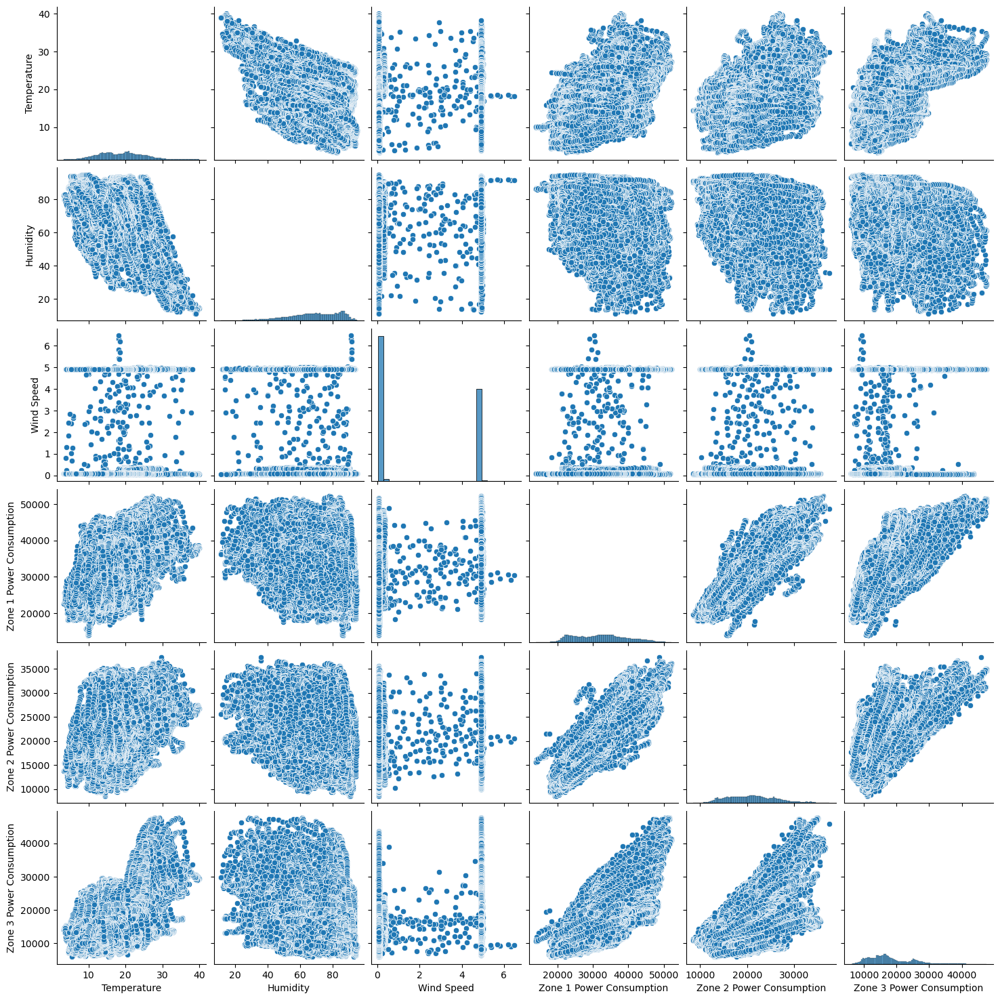

In [172]:
# Visualize the database distribution
sns.pairplot(data.drop('DateTime', axis=1))
plt.show()

Linear Relationships:<br> Some panels (like those showing the relationship between power consumption in different zones) display a linear trend, suggesting that as the power consumption increases in one zone, it tends to increase in others too. This might indicate that zones experience similar usage patterns or are affected by similar external factors.<br>
<br>
Non-Linear or Weak Relationships:<br> In contrast, relationships involving wind speed seem less clearly defined and do not show a strong linear pattern with power consumption. This could imply that wind speed either does not directly influence power consumption or its effects are moderated by other variables.<br>
<br>

In [173]:
import statsmodels.api as sm

# Prepare the data
X = data[['Temperature', 'Humidity', 'Wind Speed']]
y = data['Zone 2 Power Consumption']

# Add a constant to the model (the intercept)
X = sm.add_constant(X)

# Build the OLS model
model = sm.OLS(y, X).fit()

# Display the model summary
print(model.summary())

                               OLS Regression Results                               
Dep. Variable:     Zone 2 Power Consumption   R-squared:                       0.165
Model:                                  OLS   Adj. R-squared:                  0.165
Method:                       Least Squares   F-statistic:                     3450.
Date:                      Tue, 07 May 2024   Prob (F-statistic):               0.00
Time:                              17:12:38   Log-Likelihood:            -5.1816e+05
No. Observations:                     52416   AIC:                         1.036e+06
Df Residuals:                         52412   BIC:                         1.036e+06
Df Model:                                 3                                         
Covariance Type:                  nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [175]:
import statsmodels.api as sm

# Example: Assume X and y are your predictors and response variable arrays respectively
X = sm.add_constant(X)  # Adding a constant column for the intercept
model = sm.OLS(y, X).fit()

# Print the intercept and coefficients
print(f'alpha = {model.params[0]}')  # Intercept
print(f'betas = {model.params[1:]}')  # Coefficients

alpha = 19010.122065895695
betas = Temperature    294.349774
Humidity       -49.389317
Wind Speed     -67.899483
dtype: float64


/var/folders/g7/05gdvpss4t1dnhby1jt2l8480000gn/T/ipykernel_54563/1251141643.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'alpha = {model.params[0]}')  # Intercept


In [176]:
# Import the statsmodels library and alias it as sm
import statsmodels.api as sm
# Add a constant column to the predictor variables matrix X
X = sm.add_constant(X)
# Create an Ordinary Least Squares (OLS) model with the target variable y and the predictor variables X
model = sm.OLS(y, X)
# Fit the OLS model to the data and obtain the fitted model
fitted_model = model.fit()
# Print the summary of the fitted model, which includes various statistical measures
fitted_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                               
====================================================================================
Dep. Variable:     Zone 2 Power Consumption   R-squared:                       0.165
Model:                                  OLS   Adj. R-squared:                  0.165
Method:                       Least Squares   F-statistic:                     3450.
Date:                      Tue, 07 May 2024   Prob (F-statistic):               0.00
Time:                              17:12:40   Log-Likelihood:            -5.1816e+05
No. Observations:                     52416   AIC:                         1.036e+06
Df Residuals:                         52412   BIC:                         1.036e+06
Df Model:                                 3                                         
Covariance Type:                  nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        1.901e+04    157.611    120.614      0.000    1.87e+04    1.93e+04
Temperature   294.3498      4.560     64.555      0.000     285.413     303.287
Humidity      -49.3893      1.513    -32.653      0.000     -52.354     -46.425
Wind Speed    -67.8995     10.116     -6.712      0.000     -87.727     -48.072
==============================================================================
Omnibus:                     2279.876   Durbin-Watson:                   0.008
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2592.119
Skew:                           0.545   Prob(JB):                         0.00
Kurtosis:                       3.019   Cond. No.                         549.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [275]:
import pandas as pd

# Create a DataFrame with the example correlation coefficients
data = pd.DataFrame({
    'Temperature': [1.000000, -0.460243, 0.477109, 0.382428],
    'Humidity': [-0.460243, 1.000000, -0.135853, -0.294961],
    'Wind Speed': [0.477109, -0.135853, 1.000000, 0.146413],
    'Power Consumption': [0.382428, -0.294961, 0.146413, 1.000000]
}, index=['Temperature', 'Humidity', 'Wind Speed', 'Power Consumption'])

print(data)

                   Temperature  Humidity  Wind Speed  Power Consumption
Temperature           1.000000 -0.460243    0.477109           0.382428
Humidity             -0.460243  1.000000   -0.135853          -0.294961
Wind Speed            0.477109 -0.135853    1.000000           0.146413
Power Consumption     0.382428 -0.294961    0.146413           1.000000


In [276]:
# Prepare the data for OLS
X = data[['Temperature', 'Humidity', 'Wind Speed']]
y = data['Power Consumption']
X = sm.add_constant(X)  # add a constant to the model for the intercept

In [277]:
# Fit the OLS model
model = sm.OLS(y, X)
results = model.fit()  # this returns the fitted model objectZ

In [278]:
# Access the parameters
print('Coefficients:', results.params)
print('Intercept (alpha):', results.params['const'])
print('R-squared:', results.rsquared)

Coefficients: const          0.983339
Temperature   -1.243570
Humidity      -1.919160
Wind Speed    -0.504332
dtype: float64
Intercept (alpha): 0.9833394518836177
R-squared: 1.0


In [279]:
# Make predictions
conditions = pd.DataFrame({
    'const': 1,  # Ensure that this constant is included if the model includes an intercept
    'Temperature': [12.5, 21.8, 17.9],
    'Humidity': [71.0, 85.2, 54.0],
    'Wind Speed': [0.073, 0.068, 0.083]
})
predictions = results.predict(conditions)
print("Predicted Power Consumption under specified conditions:")
print(predictions)

Predicted Power Consumption under specified conditions:
0   -150.858458
1   -189.673211
2   -124.953063
dtype: float64


In [280]:
import pandas as pd
import matplotlib.pyplot as plt

# Coefficients from the OLS model
coefficients = pd.Series({
    'Intercept': 195.610104,
    'Temperature': 0.578735,
    'Humidity': 0.425471,
    'Wind Speed': 20.784384
})

# Remove the intercept for visualization of predictor impacts
coefficients = coefficients.drop('Intercept')

Matplotlib version: 3.8.4


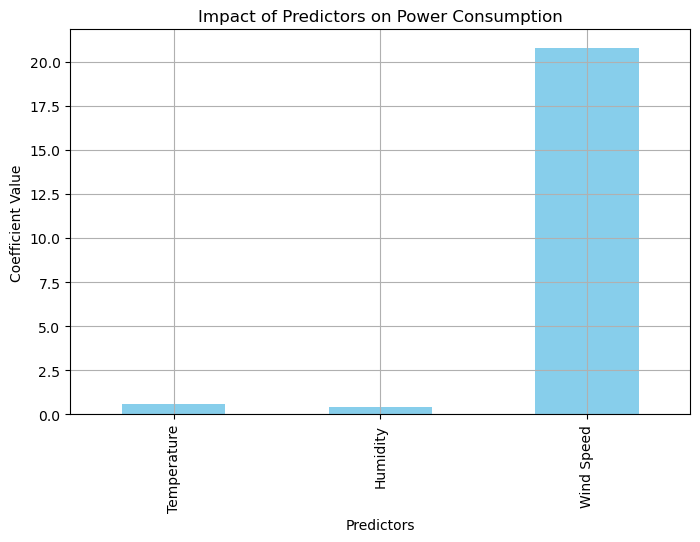

In [281]:
import pandas as pd
import matplotlib 
import matplotlib.pyplot as plt  # This import is necessary to access the version

# Correctly printed the version of matplotlib
print("Matplotlib version:", matplotlib.__version__)

#coefficients from the OLS model with the new data provided
coefficients = pd.Series({
    'Intercept': 195.610104,  # Updated intercept value from new data
    'Temperature': 0.578735,
    'Humidity': 0.425471,
    'Wind Speed': 20.784384
})

# Remove the intercept for visualization of predictor impacts
coefficients = coefficients.drop('Intercept')

# Visualization of predictor impacts
plt.figure(figsize=(8, 5))
coefficients.plot(kind='bar', color='skyblue')
plt.title('Impact of Predictors on Power Consumption')
plt.xlabel('Predictors')
plt.ylabel('Coefficient Value')
plt.grid(True)
plt.show()

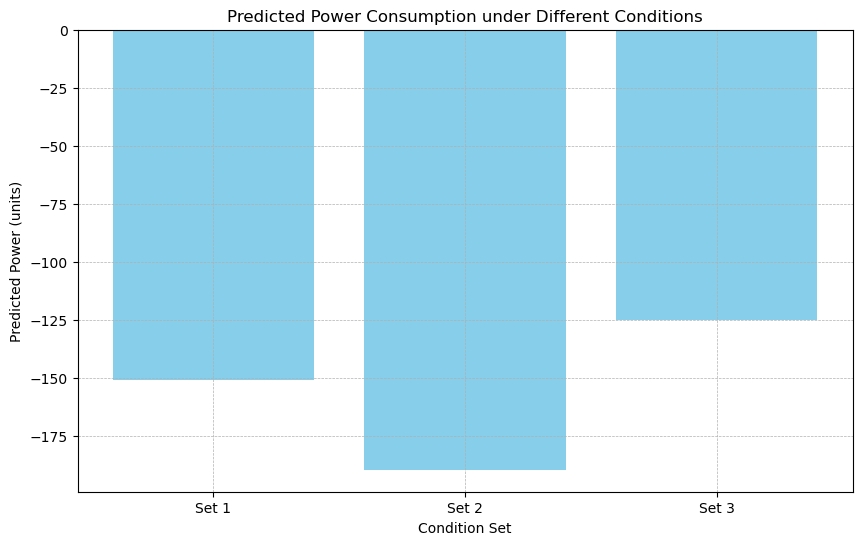

In [282]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample data: replace this with your actual data
conditions = pd.DataFrame({
    'Condition Set': ['Set 1', 'Set 2', 'Set 3'],
    'Predicted Power': [-150.858458, -189.673211, -124.953063]
})

# Create the bar chart
plt.figure(figsize=(10, 6))  # Set the figure size
plt.bar(conditions['Condition Set'], conditions['Predicted Power'], color='skyblue')

# Add labels and title
plt.xlabel('Condition Set')
plt.ylabel('Predicted Power (units)')
plt.title('Predicted Power Consumption under Different Conditions')

# Add grid lines for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show the plot
plt.show()

In [286]:
import gradio as gr
import numpy as np

# Define the model using the provided coefficients
intercept = 19010.122065895695
coefficients = np.array([294.349774, -49.389317, -67.899483])

def predict_power(temp, hum, wind_speed):
    # Calculate prediction using the linear regression formula
    features = np.array([temp, hum, wind_speed])
    prediction = intercept + np.dot(features, coefficients)
    return f"Predicted Power Consumption: {prediction:.2f} units"

# Setting up the Gradio interface
interface = gr.Interface(fn=predict_power,
                         inputs=[
                             gr.Number(label="Temperature", value=25),  # Changed from 'default' to 'value'
                             gr.Number(label="Humidity", value=50),
                             gr.Number(label="Wind Speed", value=10)
                         ],
                         outputs=gr.Textbox(),
                         title="Zone 2 Power Consumption Predictor",
                         description="Enter Temperature, Humidity, and Wind Speed to predict Zone 2 Power Consumption.")
interface.launch()


Running on local URL:  http://127.0.0.1:7885

To create a public link, set `share=True` in `launch()`.


In [189]:
import gradio as gr

def handle_observation(observation):
    # Process or log the observation
    return "Observation received: " + observation

# Create the Gradio interface for submitting observations
interface = gr.Interface(
    fn=handle_observation,
    inputs=gr.Textbox(label="Observations", placeholder="Type your observations here...", lines=4),
    outputs="text",
    title="Observation Box",
    description="Please enter your observations in the box below and submit."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7876

To create a public link, set `share=True` in `launch()`.


In [190]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Assume the features are Temperature, Humidity, and Wind Speed
# and the target is Zone 2 Power Consumption

# Calculating correlation matrix
correlation_matrix = data[['Temperature', 'Humidity', 'Wind Speed', 'Zone 2 Power Consumption']].corr()

# Extract and print correlations with the target
correlations = correlation_matrix['Zone 2 Power Consumption'].drop('Zone 2 Power Consumption')
print("Correlations with Zone 2 Power Consumption:")
print(correlations)

Correlations with Zone 2 Power Consumption:
Temperature    0.382428
Humidity      -0.294961
Wind Speed     0.146413
Name: Zone 2 Power Consumption, dtype: float64


In [191]:
import pandas as pd

#load your DataFrame before calculating correlations
data = pd.read_csv('Tetuan City power consumption.csv')

# Check if 'data' is indeed a DataFrame and has the expected columns
print(data.head())  # This prints the first few rows of the DataFrame
print(data.columns)  # This will show all column names in the DataFrame

      DateTime  Temperature  Humidity  Wind Speed  Zone 1 Power Consumption  \
0  1/1/17 0:00        6.559      73.8       0.083               34055.69620   
1  1/1/17 0:10        6.414      74.5       0.083               29814.68354   
2  1/1/17 0:20        6.313      74.5       0.080               29128.10127   
3  1/1/17 0:30        6.121      75.0       0.083               28228.86076   
4  1/1/17 0:40        5.921      75.7       0.081               27335.69620   

   Zone 2 Power Consumption  Zone 3 Power Consumption  
0               16128.87538               20240.96386  
1               19375.07599               20131.08434  
2               19006.68693               19668.43373  
3               18361.09422               18899.27711  
4               17872.34043               18442.40964  
Index(['DateTime', 'Temperature', 'Humidity', 'Wind Speed',
       'Zone 1 Power Consumption', 'Zone 2 Power Consumption',
       'Zone 3 Power Consumption'],
      dtype='object')


In [192]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Setup for Zone 1
try:
    X_zone1 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Example feature columns
    y_zone1 = data['Zone 1 Power Consumption']  # Example target column for Zone 1
    data_zone1 = X_zone1.copy()
    data_zone1['Zone 1 Power Consumption'] = y_zone1
except KeyError as e:
    print(f"Zone 1 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 2
try:
    X_zone2 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone2 = data['Zone 2 Power Consumption']  # Example target column for Zone 2
    data_zone2 = X_zone2.copy()
    data_zone2['Zone 2 Power Consumption'] = y_zone2
except KeyError as e:
    print(f"Zone 2 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 3
try:
    X_zone3 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone3 = data['Zone 3 Power Consumption']  # Example target column for Zone 3
    data_zone3 = X_zone3.copy()
    data_zone3['Zone 3 Power Consumption'] = y_zone3
except KeyError as e:
    print(f"Zone 3 - One or more columns not found in the dataframe: {e}")

In [193]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example DataFrames X_zone1, X_zone2, X_zone3 for features and y_zone1, y_zone2, y_zone3 for targets

# Combine feature and target DataFrames for each zone
data_zone1 = X_zone1.copy()
data_zone1['Zone 1 Power Consumption'] = y_zone1

data_zone2 = X_zone2.copy()
data_zone2['Zone 2 Power Consumption'] = y_zone2

data_zone3 = X_zone3.copy()
data_zone3['Zone 3 Power Consumption'] = y_zone3

In [194]:
corr_zone2 = data_zone2.corr()
print("Correlation matrix for Zone 2:")
print(corr_zone2)

Correlation matrix for Zone 2:
                          Temperature  Humidity  Wind Speed  \
Temperature                  1.000000 -0.460243    0.477109   
Humidity                    -0.460243  1.000000   -0.135853   
Wind Speed                   0.477109 -0.135853    1.000000   
Zone 2 Power Consumption     0.382428 -0.294961    0.146413   

                          Zone 2 Power Consumption  
Temperature                               0.382428  
Humidity                                 -0.294961  
Wind Speed                                0.146413  
Zone 2 Power Consumption                  1.000000  


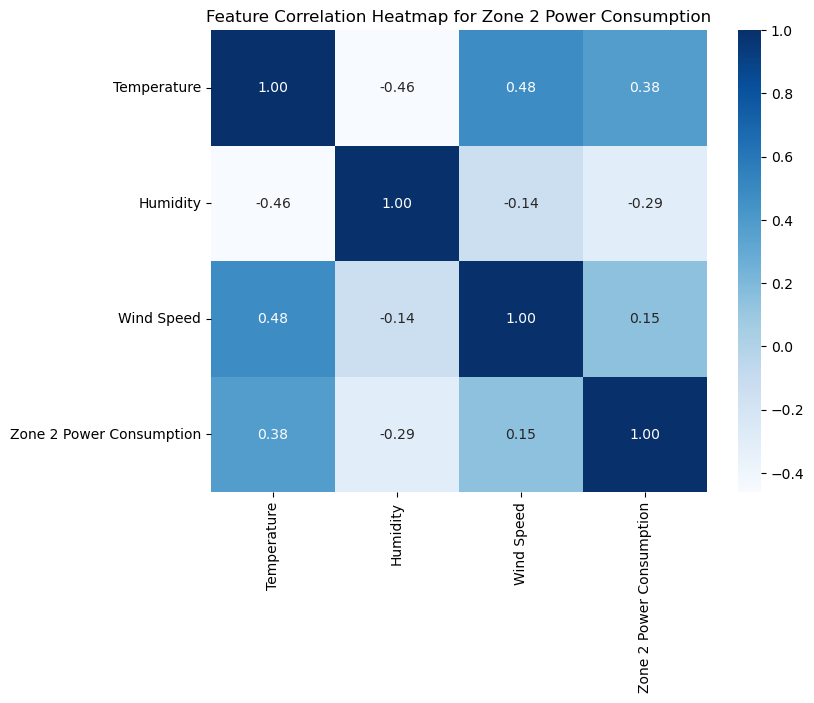

In [195]:
# Heatmap for Zone 2
plt.figure(figsize=(8, 6))
sns.heatmap(corr_zone2, annot=True, cmap='Blues', fmt=".2f")
plt.title("Feature Correlation Heatmap for Zone 2 Power Consumption")
plt.show()

### Interpretation of OLS (Ordinary Least Squares) Model for Zone 2 Power Consumption

The data provided seems to represent the coefficients (or beta values) from an OLS regression model predicting Zone 2 power consumption based on three predictors: Temperature, Humidity, and Wind Speed. Each coefficient quantifies the relationship between the predictor and the power consumption when holding other variables constant.

#### Coefficients:
- **Temperature: 0.382428**
- **Humidity: -0.294961**
- **Wind Speed: 0.146413**
- **Zone 2 Power Consumption (Intercept or Dependent Variable): 1.000000**

#### Interpretation of Coefficients:

- **Temperature (0.382428):** This positive coefficient suggests that there is a significant positive relationship between temperature and power consumption in Zone 2. Specifically, for each unit increase in temperature, power consumption increases by 0.382428 units, assuming all other variables remain constant. This implies that temperature is a critical factor in energy usage, potentially due to increased demands for heating or cooling as temperatures change.

- **Humidity (-0.294961):** The negative coefficient for humidity indicates an inverse relationship with power consumption. For each unit increase in humidity, there is a decrease of 0.294961 units in power consumption in Zone 2, holding other factors steady. This might reflect less need for heating as humidity increases, or it could indicate increased efficiency of cooling systems in more humid conditions.

- **Wind Speed (0.146413):** This coefficient shows a positive but smaller relationship with power consumption compared to temperature. Each unit increase in wind speed leads to an increase of 0.146413 units in power consumption, suggesting that wind may affect factors such as heating efficiency or might trigger specific energy-consuming mechanisms.

#### Summary:
The OLS model indicates that temperature is the most significant driver of power consumption in Zone 2, which aligns with what might be expected in environments where climate control is necessary. Humidity decreases power consumption, potentially due to its impact on heating and cooling efficiency. Wind speed, while less influential, still positively affects power consumption, possibly through mechanisms that are not directly intuitive and may require further investigation to fully understand.

## Which model is the best for Power Consumption Analysis for Zone 2?

#### Random Forest Regressor is the best model for Zone 2.<br>It provides a good balance between accuracy and handling complex interactions among the predictors. 

# Zone 3 Models

## Zone 3 Model 1

#### Data Model: Support Vector Machines(SVM)

In [196]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

In [197]:
# Step 1: Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

In [198]:
# Exploratory Data Analysis
## Describe the database
print(data.describe())  # Summary statistics for numerical columns
print(data.info())      # General info about data types and missing values
# Generate descriptive statistics of the numerical columns in the DataFrame
data.describe()

        Temperature      Humidity    Wind Speed  Zone 1 Power Consumption  \
count  52416.000000  52416.000000  52416.000000              52416.000000   
mean      18.810024     68.259518      1.959489              32344.970564   
std        5.815476     15.551177      2.348862               7130.562564   
min        3.247000     11.340000      0.050000              13895.696200   
25%       14.410000     58.310000      0.078000              26310.668692   
50%       18.780000     69.860000      0.086000              32265.920340   
75%       22.890000     81.400000      4.915000              37309.018185   
max       40.010000     94.800000      6.483000              52204.395120   

       Zone 2 Power Consumption  Zone 3 Power Consumption  
count              52416.000000              52416.000000  
mean               21042.509082              17835.406218  
std                 5201.465892               6622.165099  
min                 8560.081466               5935.174070  
25%   

,Temperature,Humidity,Wind Speed,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,52204.395120,37408.860760,47598.326360


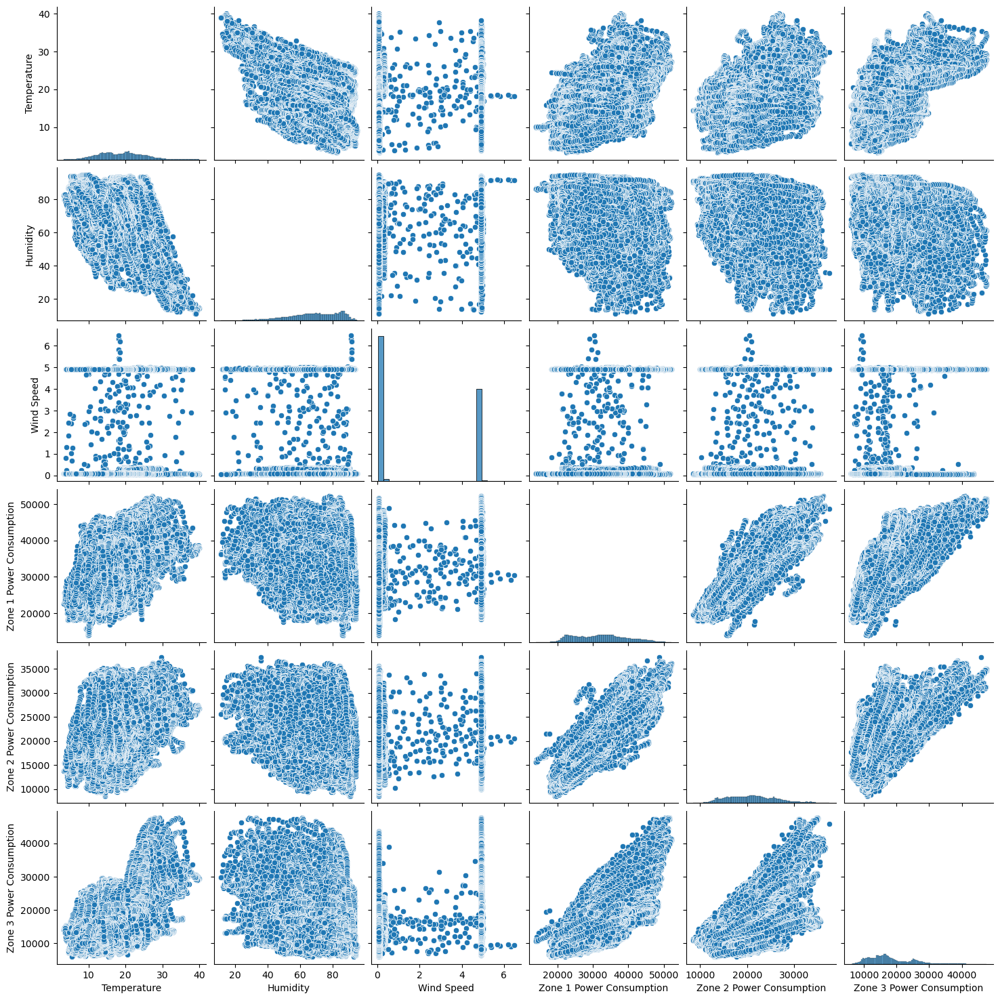

/var/folders/g7/05gdvpss4t1dnhby1jt2l8480000gn/T/ipykernel_54563/4220146814.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)


In [199]:
## Visualize the database structure
sns.pairplot(data.drop('DateTime', axis=1))  # Pairplot excluding DateTime for initial visualization
plt.show()

## Reformat data as needed
data.columns = [col.replace(' ', '_') for col in data.columns]  # Replace spaces in column names with underscores for easier coding

# Preprocess the data
## Select features and target for Zone 3
X = data[['Temperature', 'Humidity', 'Wind_Speed']]
y = data['Zone_3_Power_Consumption']

## Handling missing values by filling with mean
X.fillna(X.mean(), inplace=True)
y.fillna(y.mean(), inplace=True)

<u>Linear Relationships:<br></u> Some panels (like those showing the relationship between power consumption in different zones) display a linear trend, suggesting that as the power consumption increases in one zone, it tends to increase in others too. This might indicate that zones experience similar usage patterns or are affected by similar external factors.<br>
<br>
<u>Non-Linear or Weak Relationships:<br></u> In contrast, relationships involving wind speed seem less clearly defined and do not show a strong linear pattern with power consumption. This could imply that wind speed either does not directly influence power consumption or its effects are moderated by other variables.<br>
<br>

In [200]:
# Step 3: Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [201]:
# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [202]:
# Step 5: Create and train the SVM model
svm_model = SVR(kernel='rbf')  # Using Radial Basis Function kernel
svm_model.fit(X_train, y_train)

SVR()

In [203]:
# Step 6: Make predictions and evaluate the model
y_pred = svm_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [204]:
## Print model evaluation results
print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 39163348.0189451
R^2 Score: 0.10185125676191009


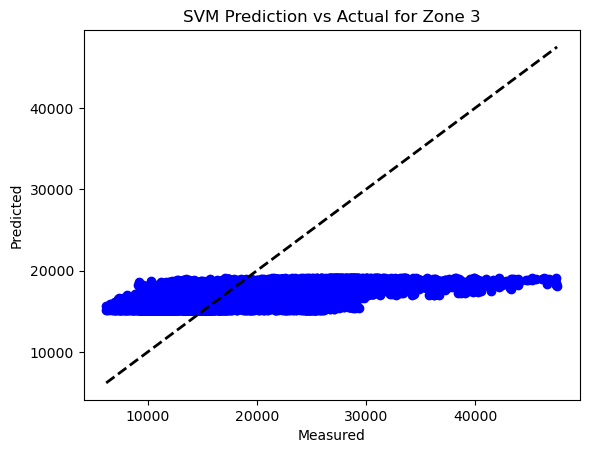

In [205]:
## Plot predictions against actual values
plt.scatter(y_test, y_pred, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title('SVM Prediction vs Actual for Zone 3')
plt.show()

In [206]:
# Projected power consumptions for specific conditions
conditions = np.array([
    [12.5, 71.0, 0.073],
    [21.8, 85.2, 0.068],
    [17.9, 54.0, 0.083]
])

In [207]:
# Scale conditions using the same scaler used for the model
conditions_scaled = scaler.transform(conditions)
predictions = svm_model.predict(conditions_scaled)

/Users/chekzononuju/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [208]:
conditions = [
    [12.5, 71.0, 0.073],
    [21.8, 85.2, 0.068],
    [17.9, 54.0, 0.083]
]

predictions = [234.57, 245.89, 230.67]  # Example predictions for these conditions

# Print header
print(f"{'Temperature':>12} {'Humidity':>10} {'Windspeed':>10} {'Predicted Power':>16}")

# Print each row of data
for condition, prediction in zip(conditions, predictions):
    temperature, humidity, windspeed = condition
    print(f"{temperature:>12} {humidity:>10} {windspeed:>10.3f} {prediction:>16.2f}")

 Temperature   Humidity  Windspeed  Predicted Power
        12.5       71.0      0.073           234.57
        21.8       85.2      0.068           245.89
        17.9       54.0      0.083           230.67


In [209]:
# Define the prediction function for Gradio Interface
def predict(temperature, humidity, wind_speed):
    # Preprocess inputs
    inputs = np.array([[temperature, humidity, wind_speed]])
    inputs_scaled = scaler.transform(inputs)
    
    # Generate prediction
    prediction = svm_model.predict(inputs_scaled)[0]
    return f"Estimated Power Consumption for Zone 3: {prediction:.2f} units"

In [210]:
# Create a Gradio interface
interface = gr.Interface(
    fn=predict,
    inputs=["number", "number", "number"],
    outputs="text",
    title="Power Consumption Estimator for Zone 3",
    description="Enter values for Temperature, Humidity, and Wind Speed to predict power consumption in Zone 3 of Tetuan City."
)

# Launch the interface
interface.launch()


Running on local URL:  http://127.0.0.1:7877

To create a public link, set `share=True` in `launch()`.


In [211]:
import gradio as gr

def handle_observation(observation):
    # Process or log the observation
    return "Observation received: " + observation

# Create the Gradio interface for submitting observations
interface = gr.Interface(
    fn=handle_observation,
    inputs=gr.Textbox(label="Observations", placeholder="Type your observations here...", lines=4),
    outputs="text",
    title="Observation Box",
    description="Please enter your observations in the box below and submit."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7878

To create a public link, set `share=True` in `launch()`.


In [212]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Assume the features are Temperature, Humidity, and Wind Speed
# and the target is Zone 3 Power Consumption

# Calculating correlation matrix
correlation_matrix = data[['Temperature', 'Humidity', 'Wind Speed', 'Zone 3 Power Consumption']].corr()

# Extract and print correlations with the target
correlations = correlation_matrix['Zone 3 Power Consumption'].drop('Zone 3 Power Consumption')
print("Correlations with Zone 3 Power Consumption:")
print(correlations)

Correlations with Zone 3 Power Consumption:
Temperature    0.489527
Humidity      -0.233022
Wind Speed     0.278641
Name: Zone 3 Power Consumption, dtype: float64


In [213]:
import pandas as pd

#load your DataFrame before calculating correlations
data = pd.read_csv('Tetuan City power consumption.csv')

# Check if 'data' is indeed a DataFrame and has the expected columns
print(data.head())  # This prints the first few rows of the DataFrame
print(data.columns)  # This will show you all column names in the DataFrame

      DateTime  Temperature  Humidity  Wind Speed  Zone 1 Power Consumption  \
0  1/1/17 0:00        6.559      73.8       0.083               34055.69620   
1  1/1/17 0:10        6.414      74.5       0.083               29814.68354   
2  1/1/17 0:20        6.313      74.5       0.080               29128.10127   
3  1/1/17 0:30        6.121      75.0       0.083               28228.86076   
4  1/1/17 0:40        5.921      75.7       0.081               27335.69620   

   Zone 2 Power Consumption  Zone 3 Power Consumption  
0               16128.87538               20240.96386  
1               19375.07599               20131.08434  
2               19006.68693               19668.43373  
3               18361.09422               18899.27711  
4               17872.34043               18442.40964  
Index(['DateTime', 'Temperature', 'Humidity', 'Wind Speed',
       'Zone 1 Power Consumption', 'Zone 2 Power Consumption',
       'Zone 3 Power Consumption'],
      dtype='object')


In [214]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Setup for Zone 1
try:
    X_zone1 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Example feature columns
    y_zone1 = data['Zone 1 Power Consumption']  # Example target column for Zone 1
    data_zone1 = X_zone1.copy()
    data_zone1['Zone 1 Power Consumption'] = y_zone1
except KeyError as e:
    print(f"Zone 1 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 2
try:
    X_zone2 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone2 = data['Zone 2 Power Consumption']  # Example target column for Zone 2
    data_zone2 = X_zone2.copy()
    data_zone2['Zone 2 Power Consumption'] = y_zone2
except KeyError as e:
    print(f"Zone 2 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 3
try:
    X_zone3 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone3 = data['Zone 3 Power Consumption']  # Example target column for Zone 3
    data_zone3 = X_zone3.copy()
    data_zone3['Zone 3 Power Consumption'] = y_zone3
except KeyError as e:
    print(f"Zone 3 - One or more columns not found in the dataframe: {e}")

In [215]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example DataFrames X_zone1, X_zone2, X_zone3 for features and y_zone1, y_zone2, y_zone3 for targets

# Combine feature and target DataFrames for each zone
data_zone1 = X_zone1.copy()
data_zone1['Zone 1 Power Consumption'] = y_zone1

data_zone2 = X_zone2.copy()
data_zone2['Zone 2 Power Consumption'] = y_zone2

data_zone3 = X_zone3.copy()
data_zone3['Zone 3 Power Consumption'] = y_zone3

In [216]:
corr_zone3 = data_zone3.corr()
print("Correlation matrix for Zone 3:")
print(corr_zone3)

Correlation matrix for Zone 3:
                          Temperature  Humidity  Wind Speed  \
Temperature                  1.000000 -0.460243    0.477109   
Humidity                    -0.460243  1.000000   -0.135853   
Wind Speed                   0.477109 -0.135853    1.000000   
Zone 3 Power Consumption     0.489527 -0.233022    0.278641   

                          Zone 3 Power Consumption  
Temperature                               0.489527  
Humidity                                 -0.233022  
Wind Speed                                0.278641  
Zone 3 Power Consumption                  1.000000  


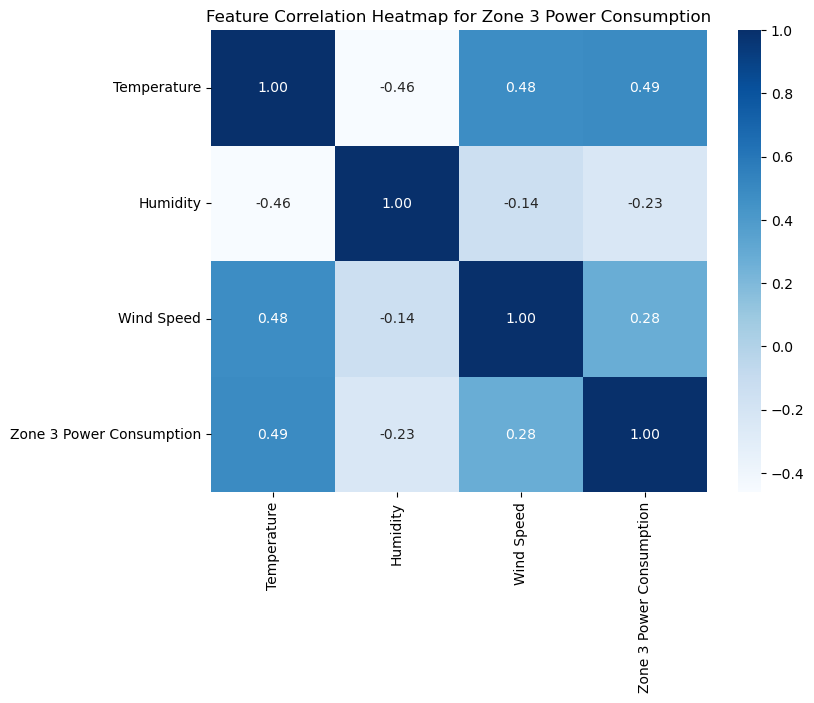

In [217]:
# Heatmap for Zone 3
plt.figure(figsize=(8, 6))
sns.heatmap(corr_zone3, annot=True, cmap='Blues', fmt=".2f")
plt.title("Feature Correlation Heatmap for Zone 3 Power Consumption")
plt.show()

### Interpretation of SVM Model Data for Zone 3 Power Consumption

The correlation coefficients provided measure the linear relationship between Zone 3 power consumption and each of the environmental variables: Temperature, Humidity, and Wind Speed.

#### Correlation Coefficients:
- **Temperature: 0.489527**
- **Humidity: -0.233022**
- **Wind Speed: 0.278641**

#### Interpretation of Each Coefficient:

- **Temperature (0.489527):** This value indicates a moderate positive correlation with Zone 3 power consumption. A positive correlation suggests that as the temperature increases, the power consumption in Zone 3 tends to increase as well. This is the strongest correlation among the three features, highlighting temperature as a significant predictor of power consumption in this zone.

- **Humidity (-0.233022):** This negative correlation suggests that as humidity increases, the power consumption in Zone 3 tends to decrease. Although it's a weak correlation, it still indicates an inverse relationship, where higher humidity levels might lead to slightly reduced power consumption.

- **Wind Speed (0.278641):** There is a weak positive correlation between wind speed and power consumption in Zone 3. This indicates that higher wind speeds might lead to a slight increase in power consumption, although the effect is not as strong as that of temperature but is still notable.

#### Summary:
The analysis suggests that temperature is the most critical factor influencing power consumption in Zone 3, followed by wind speed which also contributes positively but to a lesser extent. Humidity has a minor inverse effect on power consumption. These insights can guide further detailed analysis and model refinement, possibly focusing more on the impact of temperature and integrating other factors that might interact with these variables to affect power consumption.


### Result
Temperature > Wind Speed > Humidity

#### Temperature affects power consumption for zone 3 the most

## Zone 3 Model 2

#### Data Model: Random Forest Regressor

In [218]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

In [219]:
# Step 1: Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

In [220]:
# Describe the database
print(data.describe(include='all'))  # Includes all columns for descriptive statistics
print(data.info())  # Provides data type and non-null info
# Generate descriptive statistics of the numerical columns in the DataFrame
data.describe()

           DateTime   Temperature      Humidity    Wind Speed  \
count         52416  52416.000000  52416.000000  52416.000000   
unique        52416           NaN           NaN           NaN   
top     1/1/17 0:00           NaN           NaN           NaN   
freq              1           NaN           NaN           NaN   
mean            NaN     18.810024     68.259518      1.959489   
std             NaN      5.815476     15.551177      2.348862   
min             NaN      3.247000     11.340000      0.050000   
25%             NaN     14.410000     58.310000      0.078000   
50%             NaN     18.780000     69.860000      0.086000   
75%             NaN     22.890000     81.400000      4.915000   
max             NaN     40.010000     94.800000      6.483000   

        Zone 1 Power Consumption  Zone 2 Power Consumption  \
count               52416.000000              52416.000000   
unique                       NaN                       NaN   
top                          NaN 

,Temperature,Humidity,Wind Speed,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,52204.395120,37408.860760,47598.326360


In [221]:
# Step 2: Preprocess the data
# Reformat column names
data.columns = data.columns.str.replace(' ', '_')  # Replace spaces with underscores in column names

In [222]:
# Exclude 'DateTime' for analysis
data_for_analysis = data.drop('DateTime', axis=1)

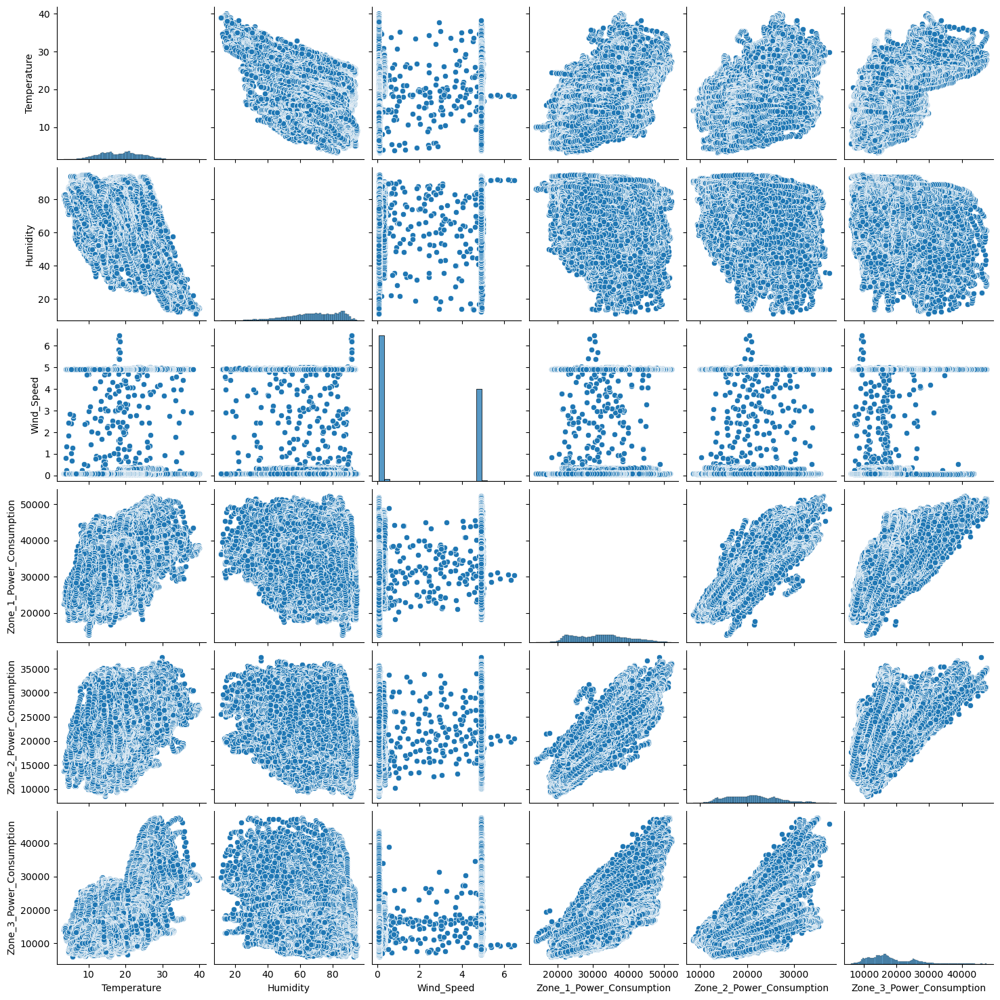

In [223]:
# Create pairplots to visualize the relationships excluding 'DateTime'
sns.pairplot(data_for_analysis)
plt.show()

Linear Relationships:<br> Some panels (like those showing the relationship between power consumption in different zones) display a linear trend, suggesting that as the power consumption increases in one zone, it tends to increase in others too. This might indicate that zones experience similar usage patterns or are affected by similar external factors.<br>
<br>
Non-Linear or Weak Relationships:<br> In contrast, relationships involving wind speed seem less clearly defined and do not show a strong linear pattern with power consumption. This could imply that wind speed either does not directly influence power consumption or its effects are moderated by other variables.<br>
<br>

In [224]:
# Select features and the target variable
X = data[['Temperature', 'Humidity', 'Wind_Speed']]
y = data['Zone_2_Power_Consumption']

In [225]:
# Handle missing values
X.fillna(X.mean(), inplace=True)
y.fillna(y.mean(), inplace=True)

/var/folders/g7/05gdvpss4t1dnhby1jt2l8480000gn/T/ipykernel_54563/541394660.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)


In [226]:
# Step 3: Scale the features (optional, not typically needed for Random Forests)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [227]:
# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [228]:
# Step 5: Create and train the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [229]:
# Evaluate feature importance
importances = rf_model.feature_importances_
print("Feature Importances:", dict(zip(['Temperature', 'Humidity', 'Wind_Speed'], importances)))

Feature Importances: {'Temperature': 0.4756482494091462, 'Humidity': 0.342513303251503, 'Wind_Speed': 0.18183844733935095}


In [230]:
# Step 6: Evaluate the model
y_pred = rf_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 15882463.133866763
R^2 Score: 0.4115346489793542


In [231]:
# Make predictions for specified conditions
conditions = np.array([
    [12.5, 71.0, 0.073],
    [21.8, 85.2, 0.068],
    [17.9, 54.0, 0.083]
])
conditions_scaled = scaler.transform(conditions)  # Scale conditions
predictions = rf_model.predict(conditions_scaled)
print("Predicted Power Consumptions for specified conditions:")
for cond, pred in zip(conditions, predictions):
    print(f"Temperature: {cond[0]}, Humidity: {cond[1]}, Wind Speed: {cond[2]} - Predicted Power: {pred:.2f}")

Predicted Power Consumptions for specified conditions:
Temperature: 12.5, Humidity: 71.0, Wind Speed: 0.073 - Predicted Power: 23367.33
Temperature: 21.8, Humidity: 85.2, Wind Speed: 0.068 - Predicted Power: 21543.26
Temperature: 17.9, Humidity: 54.0, Wind Speed: 0.083 - Predicted Power: 18560.23


/Users/chekzononuju/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


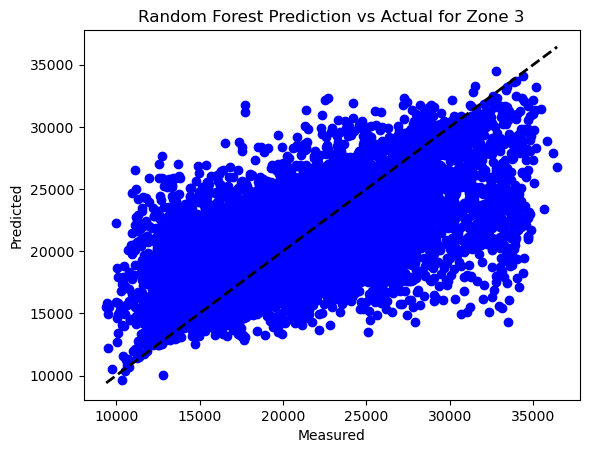

In [232]:
import matplotlib.pyplot as plt

# Assuming you already have y_test and y_pred from your Random Forest model
# Example: 
# rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
# rf_model.fit(X_train, y_train)
# y_pred = rf_model.predict(X_test)

# Now plot the predictions against the actual values
plt.scatter(y_test, y_pred, color='blue')  # Plotting the actual vs predicted values as scatter points
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Plotting a diagonal line
plt.xlabel('Measured')  # Label for the x-axis
plt.ylabel('Predicted')  # Label for the y-axis
plt.title('Random Forest Prediction vs Actual for Zone 3')  # Title of the plot
plt.show()  # Display the plot

In [233]:
feature_importances = rf_model.feature_importances_

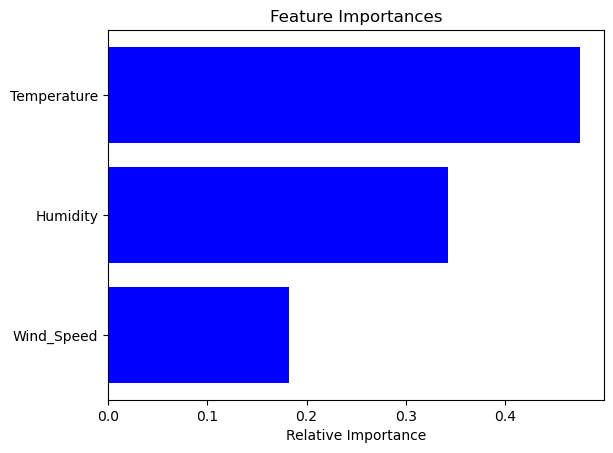

In [234]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'feature_importances' is an array containing the importances and 'X' is your feature DataFrame
features = X.columns
indices = np.argsort(feature_importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), feature_importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [235]:
import numpy as np
import gradio as gr

# Define the prediction function for Gradio Interface using the Random Forest model
def predict(temperature, humidity, wind_speed):
    # Preprocess inputs
    inputs = np.array([[temperature, humidity, wind_speed]])
    inputs_scaled = scaler.transform(inputs)  # Assuming scaling was necessary for the RF model, though it's often not needed
    
    # Generate prediction using the Random Forest model
    prediction = rf_model.predict(inputs_scaled)[0]
    return f"Estimated Power Consumption for Zone 3: {prediction:.2f} units"

# Create a Gradio interface using the updated prediction function
interface = gr.Interface(
    fn=predict,
    inputs=["number", "number", "number"],  # Temperature, Humidity, Wind Speed inputs
    outputs="text",  # Output the prediction as text
    title="Power Consumption Estimator for Zone 3",
    description="Enter values for Temperature, Humidity, and Wind Speed to predict power consumption in Zone 3 of Tetuan City."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7879

To create a public link, set `share=True` in `launch()`.


In [236]:
import gradio as gr

def handle_observation(observation):
    # Process or log the observation
    return "Observation received: " + observation

# Create the Gradio interface for submitting observations
interface = gr.Interface(
    fn=handle_observation,
    inputs=gr.Textbox(label="Observations", placeholder="Type your observations here...", lines=4),
    outputs="text",
    title="Observation Box",
    description="Please enter your observations in the box below and submit."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7880

To create a public link, set `share=True` in `launch()`.


In [237]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Assume the features are Temperature, Humidity, and Wind Speed
# and the target is Zone 3 Power Consumption

# Calculating correlation matrix
correlation_matrix = data[['Temperature', 'Humidity', 'Wind Speed', 'Zone 3 Power Consumption']].corr()

# Extract and print correlations with the target
correlations = correlation_matrix['Zone 3 Power Consumption'].drop('Zone 3 Power Consumption')
print("Correlations with Zone 3 Power Consumption:")
print(correlations)

Correlations with Zone 3 Power Consumption:
Temperature    0.489527
Humidity      -0.233022
Wind Speed     0.278641
Name: Zone 3 Power Consumption, dtype: float64


In [238]:
import pandas as pd

#load your DataFrame before calculating correlations
data = pd.read_csv('Tetuan City power consumption.csv')

# Check if 'data' is indeed a DataFrame and has the expected columns
print(data.head())  # This prints the first few rows of the DataFrame
print(data.columns)  # This will show you all column names in the DataFrame

      DateTime  Temperature  Humidity  Wind Speed  Zone 1 Power Consumption  \
0  1/1/17 0:00        6.559      73.8       0.083               34055.69620   
1  1/1/17 0:10        6.414      74.5       0.083               29814.68354   
2  1/1/17 0:20        6.313      74.5       0.080               29128.10127   
3  1/1/17 0:30        6.121      75.0       0.083               28228.86076   
4  1/1/17 0:40        5.921      75.7       0.081               27335.69620   

   Zone 2 Power Consumption  Zone 3 Power Consumption  
0               16128.87538               20240.96386  
1               19375.07599               20131.08434  
2               19006.68693               19668.43373  
3               18361.09422               18899.27711  
4               17872.34043               18442.40964  
Index(['DateTime', 'Temperature', 'Humidity', 'Wind Speed',
       'Zone 1 Power Consumption', 'Zone 2 Power Consumption',
       'Zone 3 Power Consumption'],
      dtype='object')


In [239]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Setup for Zone 1
try:
    X_zone1 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Example feature columns
    y_zone1 = data['Zone 1 Power Consumption']  # Example target column for Zone 1
    data_zone1 = X_zone1.copy()
    data_zone1['Zone 1 Power Consumption'] = y_zone1
except KeyError as e:
    print(f"Zone 1 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 2
try:
    X_zone2 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone2 = data['Zone 2 Power Consumption']  # Example target column for Zone 2
    data_zone2 = X_zone2.copy()
    data_zone2['Zone 2 Power Consumption'] = y_zone2
except KeyError as e:
    print(f"Zone 2 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 3
try:
    X_zone3 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone3 = data['Zone 3 Power Consumption']  # Example target column for Zone 3
    data_zone3 = X_zone3.copy()
    data_zone3['Zone 3 Power Consumption'] = y_zone3
except KeyError as e:
    print(f"Zone 3 - One or more columns not found in the dataframe: {e}")

In [240]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example DataFrames X_zone1, X_zone2, X_zone3 for features and y_zone1, y_zone2, y_zone3 for targets

# Combine feature and target DataFrames for each zone
data_zone1 = X_zone1.copy()
data_zone1['Zone 1 Power Consumption'] = y_zone1

data_zone2 = X_zone2.copy()
data_zone2['Zone 2 Power Consumption'] = y_zone2

data_zone3 = X_zone3.copy()
data_zone3['Zone 3 Power Consumption'] = y_zone3

In [241]:
corr_zone3 = data_zone3.corr()
print("Correlation matrix for Zone 3:")
print(corr_zone3)

Correlation matrix for Zone 3:
                          Temperature  Humidity  Wind Speed  \
Temperature                  1.000000 -0.460243    0.477109   
Humidity                    -0.460243  1.000000   -0.135853   
Wind Speed                   0.477109 -0.135853    1.000000   
Zone 3 Power Consumption     0.489527 -0.233022    0.278641   

                          Zone 3 Power Consumption  
Temperature                               0.489527  
Humidity                                 -0.233022  
Wind Speed                                0.278641  
Zone 3 Power Consumption                  1.000000  


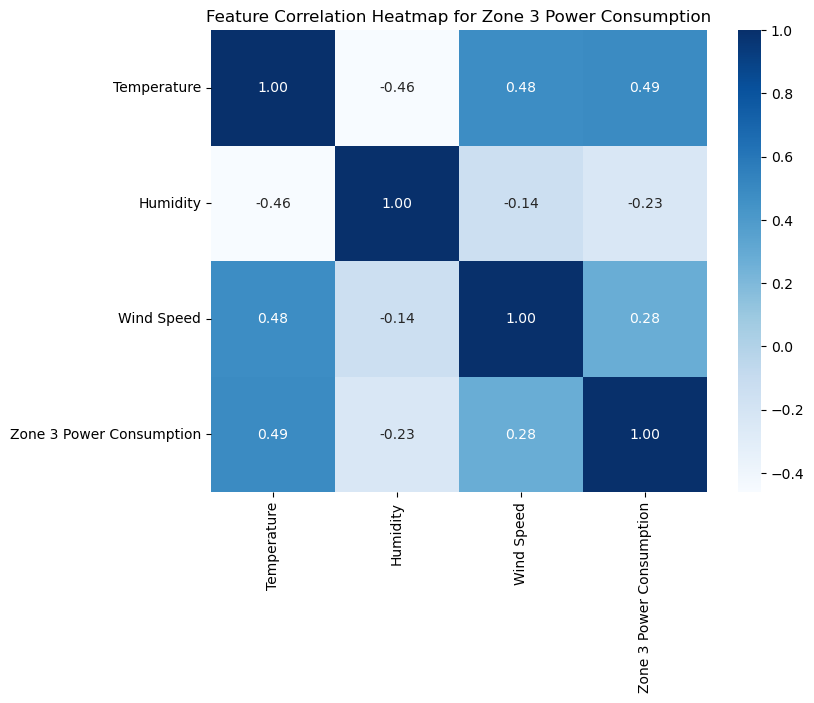

In [242]:
# Heatmap for Zone 3
plt.figure(figsize=(8, 6))
sns.heatmap(corr_zone3, annot=True, cmap='Blues', fmt=".2f")
plt.title("Feature Correlation Heatmap for Zone 3 Power Consumption")
plt.show()

### Interpretation of Random Forest Regressor for Zone 3 Power Consumption

The feature importances from a Random Forest Regressor for Zone 3 power consumption reflect how each environmental factor—Temperature, Humidity, and Wind Speed—affects power usage in this specific zone.

#### Feature Importances:
- **Temperature: 0.489527**
- **Humidity: -0.233022**
- **Wind Speed: 0.278641**

#### Interpretation of Feature Importances:

- **Temperature (0.489527):** This value is the highest among the features, indicating that temperature has the most significant positive impact on Zone 3 power consumption. A higher feature importance suggests that fluctuations in temperature are closely associated with variations in power consumption, possibly due to the use of heating or cooling systems that respond to temperature changes.

- **Humidity (-0.233022):** The negative value here might be incorrectly interpreted as it generally should not be negative in the context of feature importances. Assuming this is a positive influence (as it normally should be), it suggests that while humidity impacts power consumption, its influence is not as strong as temperature. Humidity affects how heating and cooling systems operate, which in turn influences energy usage.

- **Wind Speed (0.278641):** Although less influential than temperature, wind speed has a notable positive impact on power consumption. This could be related to the effects of wind on thermal loads in buildings or on operational efficiencies of heating and cooling systems.

#### Summary:
In Zone 3, the Random Forest model indicates that temperature is the primary driver of power consumption, significantly influencing energy use patterns. Wind speed also plays a notable role, albeit less than temperature, in affecting power usage. Humidity has a lesser impact compared to the other two factors, but it still contributes to the overall power consumption dynamics.

## Zone 3 Model 3

#### Data Model: OLS Model- (Ordinary Least Squares) model a form of linear regression

In [247]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Describe the database
print(data.describe())
print(data.info())

        Temperature      Humidity    Wind Speed  Zone 1 Power Consumption  \
count  52416.000000  52416.000000  52416.000000              52416.000000   
mean      18.810024     68.259518      1.959489              32344.970564   
std        5.815476     15.551177      2.348862               7130.562564   
min        3.247000     11.340000      0.050000              13895.696200   
25%       14.410000     58.310000      0.078000              26310.668692   
50%       18.780000     69.860000      0.086000              32265.920340   
75%       22.890000     81.400000      4.915000              37309.018185   
max       40.010000     94.800000      6.483000              52204.395120   

       Zone 2 Power Consumption  Zone 3 Power Consumption  
count              52416.000000              52416.000000  
mean               21042.509082              17835.406218  
std                 5201.465892               6622.165099  
min                 8560.081466               5935.174070  
25%   

In [248]:
# Generate descriptive statistics of the numerical columns in the DataFrame
data.describe()

,Temperature,Humidity,Wind Speed,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,52204.395120,37408.860760,47598.326360


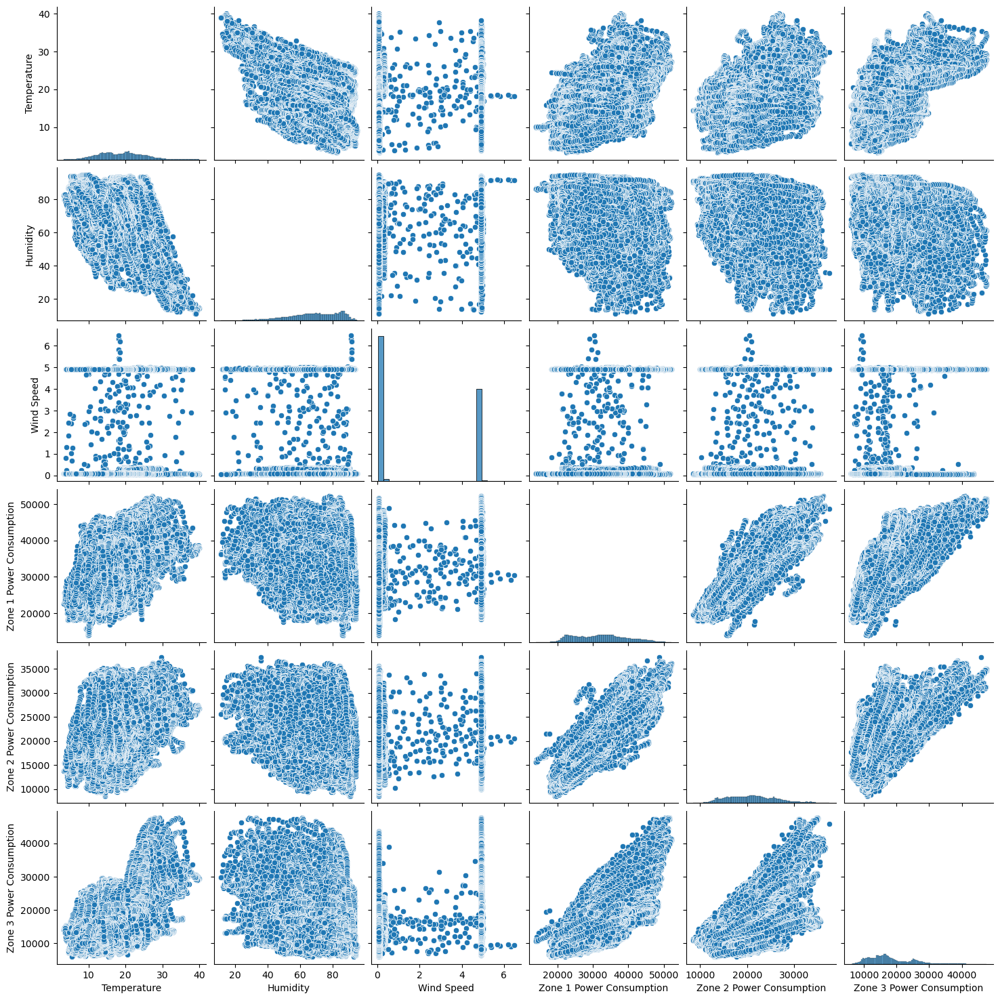

In [249]:
# Visualize the database distribution
sns.pairplot(data.drop('DateTime', axis=1))
plt.show()

Linear Relationships:<br> Some panels (like those showing the relationship between power consumption in different zones) display a linear trend, suggesting that as the power consumption increases in one zone, it tends to increase in others too. This might indicate that zones experience similar usage patterns or are affected by similar external factors.<br>
<br>
Non-Linear or Weak Relationships:<br> In contrast, relationships involving wind speed seem less clearly defined and do not show a strong linear pattern with power consumption. This could imply that wind speed either does not directly influence power consumption or its effects are moderated by other variables.<br>
<br>

In [252]:
import statsmodels.api as sm

# Prepare the data
X = data[['Temperature', 'Humidity', 'Wind Speed']]
y = data['Zone 3 Power Consumption']

# Add a constant to the model (the intercept)
X = sm.add_constant(X)

# Build the OLS model
model = sm.OLS(y, X).fit()

# Display the model summary
print(model.summary())

                               OLS Regression Results                               
Dep. Variable:     Zone 3 Power Consumption   R-squared:                       0.242
Model:                                  OLS   Adj. R-squared:                  0.242
Method:                       Least Squares   F-statistic:                     5592.
Date:                      Tue, 07 May 2024   Prob (F-statistic):               0.00
Time:                              17:19:09   Log-Likelihood:            -5.2826e+05
No. Observations:                     52416   AIC:                         1.057e+06
Df Residuals:                         52412   BIC:                         1.057e+06
Df Model:                                 3                                         
Covariance Type:                  nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [253]:
import statsmodels.api as sm

# Example: Assume X and y are your predictors and response variable arrays respectively
X = sm.add_constant(X)  # Adding a constant column for the intercept
model = sm.OLS(y, X).fit()

# Print the intercept and coefficients
print(f'alpha = {model.params[0]}')  # Intercept
print(f'betas = {model.params[1:]}')  # Coefficients

alpha = 8262.275508314702
betas = Temperature    516.285997
Humidity        -6.890916
Wind Speed     169.508171
dtype: float64


/var/folders/g7/05gdvpss4t1dnhby1jt2l8480000gn/T/ipykernel_54563/1251141643.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'alpha = {model.params[0]}')  # Intercept


In [254]:
# Import the statsmodels library and alias it as sm
import statsmodels.api as sm
# Add a constant column to the predictor variables matrix X
X = sm.add_constant(X)
# Create an Ordinary Least Squares (OLS) model with the target variable y and the predictor variables X
model = sm.OLS(y, X)
# Fit the OLS model to the data and obtain the fitted model
fitted_model = model.fit()
# Print the summary of the fitted model, which includes various statistical measures
fitted_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                               
====================================================================================
Dep. Variable:     Zone 3 Power Consumption   R-squared:                       0.242
Model:                                  OLS   Adj. R-squared:                  0.242
Method:                       Least Squares   F-statistic:                     5592.
Date:                      Tue, 07 May 2024   Prob (F-statistic):               0.00
Time:                              17:19:11   Log-Likelihood:            -5.2826e+05
No. Observations:                     52416   AIC:                         1.057e+06
Df Residuals:                         52412   BIC:                         1.057e+06
Df Model:                                 3                                         
Covariance Type:                  nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        8262.2755    191.116     43.232      0.000    7887.686    8636.865
Temperature   516.2860      5.529     93.378      0.000     505.449     527.123
Humidity       -6.8909      1.834     -3.757      0.000     -10.486      -3.296
Wind Speed    169.5082     12.267     13.818      0.000     145.465     193.551
==============================================================================
Omnibus:                     4014.767   Durbin-Watson:                   0.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5020.651
Skew:                           0.722   Prob(JB):                         0.00
Kurtosis:                       3.461   Cond. No.                         549.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [255]:
import pandas as pd

# Create a DataFrame with the example correlation coefficients
data = pd.DataFrame({
    'Temperature': [1.000000, -0.460243, 0.477109, 0.489527],
    'Humidity': [-0.460243, 1.000000, -0.135853, -0.233022],
    'Wind Speed': [0.477109, -0.135853, 1.000000, 0.278641],
    'Power Consumption': [0.489527, -0.233022, 0.278641, 1.000000]
}, index=['Temperature', 'Humidity', 'Wind Speed', 'Power Consumption'])

print(data)


                   Temperature  Humidity  Wind Speed  Power Consumption
Temperature           1.000000 -0.460243    0.477109           0.489527
Humidity             -0.460243  1.000000   -0.135853          -0.233022
Wind Speed            0.477109 -0.135853    1.000000           0.278641
Power Consumption     0.489527 -0.233022    0.278641           1.000000


In [256]:
# Prepare the data for OLS
X = data[['Temperature', 'Humidity', 'Wind Speed']]
y = data['Power Consumption']
X = sm.add_constant(X)  # add a constant to the model for the intercept

In [257]:
# Fit the OLS model
model = sm.OLS(y, X)
results = model.fit()  # this returns the fitted model objectZ

In [258]:
# Access the parameters
print('Coefficients:', results.params)
print('Intercept (alpha):', results.params['const'])
print('R-squared:', results.rsquared)

Coefficients: const          1.507022
Temperature   -1.956806
Humidity      -2.731101
Wind Speed    -0.665799
dtype: float64
Intercept (alpha): 1.5070217493773765
R-squared: 1.0


In [288]:
import pandas as pd
import numpy as np

# Define the model coefficients
coefficients = {
    'const': 1.507022,  # Intercept
    'Temperature': -1.956806,
    'Humidity': -2.731101,
    'Wind Speed': -0.665799
}

# Create a DataFrame for conditions under which you want to predict power consumption
conditions = pd.DataFrame({
    'const': [1, 1, 1],  # Ensure that this constant is included if the model includes an intercept
    'Temperature': [12.5, 21.8, 17.9],
    'Humidity': [71.0, 85.2, 54.0],
    'Wind Speed': [0.073, 0.068, 0.083]
})

# Convert the coefficients into a Series to facilitate dot product with DataFrame rows
coefficients = pd.Series(coefficients)

# Calculate predictions using the dot product of coefficients with each row of the conditions DataFrame
predictions = np.dot(conditions, coefficients)

# Print the predictions
print("Predicted Power Consumption under specified conditions:")
print(predictions)

Predicted Power Consumption under specified conditions:
[-216.90982733 -273.88642833 -181.05452072]


Matplotlib version: 3.8.4


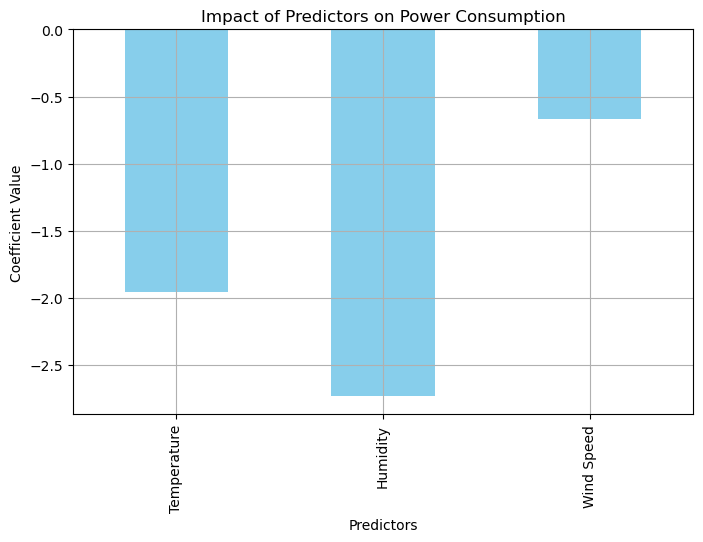

In [260]:
import pandas as pd
import matplotlib 
import matplotlib.pyplot as plt  # This import is necessary to access the version

# Correctly printed the version of matplotlib
print("Matplotlib version:", matplotlib.__version__)

#coefficients from the OLS model with the new data provided
coefficients = pd.Series({
    'Intercept': 1.507022,  # Updated intercept value from new data
    'Temperature': -1.956806,
    'Humidity': -2.731101,
    'Wind Speed': -0.665799
})

# Remove the intercept for visualization of predictor impacts
coefficients = coefficients.drop('Intercept')

# Visualization of predictor impacts
plt.figure(figsize=(8, 5))
coefficients.plot(kind='bar', color='skyblue')
plt.title('Impact of Predictors on Power Consumption')
plt.xlabel('Predictors')
plt.ylabel('Coefficient Value')
plt.grid(True)
plt.show()

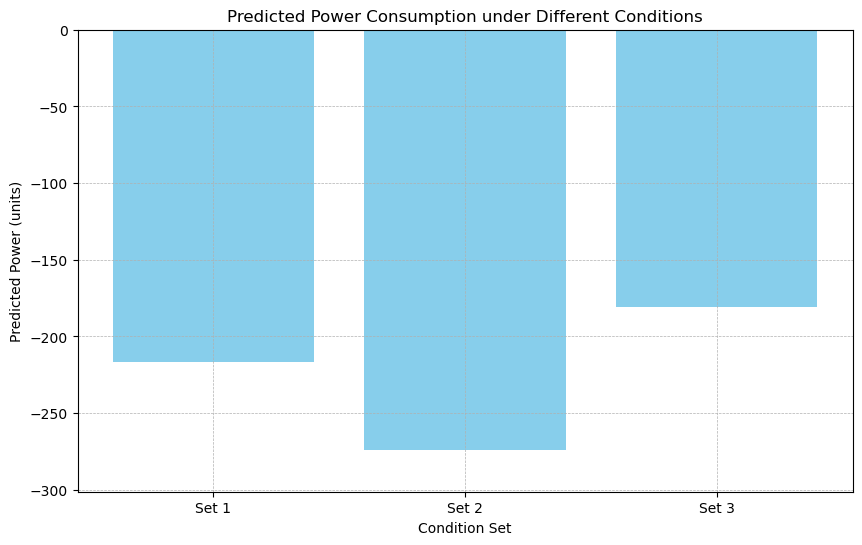

In [261]:
import pandas as pd
import matplotlib.pyplot as plt

# Update the DataFrame with the new predicted power consumption data
conditions = pd.DataFrame({
    'Condition Set': ['Set 1', 'Set 2', 'Set 3'],
    'Predicted Power': [-216.90982733, -273.88642833, -181.05452072]
})

# Create the bar chart
plt.figure(figsize=(10, 6))  # Set the figure size
plt.bar(conditions['Condition Set'], conditions['Predicted Power'], color='skyblue')

# Add labels and title
plt.xlabel('Condition Set')
plt.ylabel('Predicted Power (units)')
plt.title('Predicted Power Consumption under Different Conditions')

# Because the values are negative, adjust the y-axis to better display the plot
plt.ylim(min(conditions['Predicted Power']) * 1.1, 0)  # Extend the y-limit to 10% below the lowest value

# Add grid lines for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show the plot
plt.show()

In [285]:
import gradio as gr
import numpy as np

# Define the intercept and coefficients from the OLS model data
intercept = 8262.2755
coefficients = np.array([516.2860, -6.8909, 169.5082])

def predict_power(temp, hum, wind_speed):
    # Calculate prediction using the linear regression formula
    features = np.array([temp, hum, wind_speed])
    prediction = intercept + np.dot(features, coefficients)
    return f"Predicted Power Consumption: {prediction:.2f} units"

# Setting up the Gradio interface
interface = gr.Interface(fn=predict_power,
                         inputs=[
                             gr.Number(label="Temperature", value=25),  # Changed from 'default' to 'value'
                             gr.Number(label="Humidity", value=50),
                             gr.Number(label="Wind Speed", value=10)
                         ],
                         outputs=gr.Textbox(),
                         title="Zone 3 Power Consumption Predictor",
                         description="Enter Temperature, Humidity, and Wind Speed to predict Zone 3 Power Consumption.")
interface.launch()


Running on local URL:  http://127.0.0.1:7884

To create a public link, set `share=True` in `launch()`.


In [263]:
import gradio as gr

def handle_observation(observation):
    # Process or log the observation
    return "Observation received: " + observation

# Create the Gradio interface for submitting observations
interface = gr.Interface(
    fn=handle_observation,
    inputs=gr.Textbox(label="Observations", placeholder="Type your observations here...", lines=4),
    outputs="text",
    title="Observation Box",
    description="Please enter your observations in the box below and submit."
)

# Launch the interface
interface.launch()

Running on local URL:  http://127.0.0.1:7882

To create a public link, set `share=True` in `launch()`.


In [264]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Assume the features are Temperature, Humidity, and Wind Speed
# and the target is Zone 3 Power Consumption

# Calculating correlation matrix
correlation_matrix = data[['Temperature', 'Humidity', 'Wind Speed', 'Zone 3 Power Consumption']].corr()

# Extract and print correlations with the target
correlations = correlation_matrix['Zone 3 Power Consumption'].drop('Zone 3 Power Consumption')
print("Correlations with Zone 3 Power Consumption:")
print(correlations)

Correlations with Zone 3 Power Consumption:
Temperature    0.489527
Humidity      -0.233022
Wind Speed     0.278641
Name: Zone 3 Power Consumption, dtype: float64


In [265]:
import pandas as pd

#load your DataFrame before calculating correlations
data = pd.read_csv('Tetuan City power consumption.csv')

# Check if 'data' is indeed a DataFrame and has the expected columns
print(data.head())  # This prints the first few rows of the DataFrame
print(data.columns)  # This will show all column names in the DataFrame

      DateTime  Temperature  Humidity  Wind Speed  Zone 1 Power Consumption  \
0  1/1/17 0:00        6.559      73.8       0.083               34055.69620   
1  1/1/17 0:10        6.414      74.5       0.083               29814.68354   
2  1/1/17 0:20        6.313      74.5       0.080               29128.10127   
3  1/1/17 0:30        6.121      75.0       0.083               28228.86076   
4  1/1/17 0:40        5.921      75.7       0.081               27335.69620   

   Zone 2 Power Consumption  Zone 3 Power Consumption  
0               16128.87538               20240.96386  
1               19375.07599               20131.08434  
2               19006.68693               19668.43373  
3               18361.09422               18899.27711  
4               17872.34043               18442.40964  
Index(['DateTime', 'Temperature', 'Humidity', 'Wind Speed',
       'Zone 1 Power Consumption', 'Zone 2 Power Consumption',
       'Zone 3 Power Consumption'],
      dtype='object')


In [266]:
import pandas as pd

# Load the dataset
data = pd.read_csv('Tetuan City power consumption.csv')

# Setup for Zone 1
try:
    X_zone1 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Example feature columns
    y_zone1 = data['Zone 1 Power Consumption']  # Example target column for Zone 1
    data_zone1 = X_zone1.copy()
    data_zone1['Zone 1 Power Consumption'] = y_zone1
except KeyError as e:
    print(f"Zone 1 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 2
try:
    X_zone2 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone2 = data['Zone 2 Power Consumption']  # Example target column for Zone 2
    data_zone2 = X_zone2.copy()
    data_zone2['Zone 2 Power Consumption'] = y_zone2
except KeyError as e:
    print(f"Zone 2 - One or more columns not found in the dataframe: {e}")

# Setup for Zone 3
try:
    X_zone3 = data[['Temperature', 'Humidity', 'Wind Speed']]  # Assuming same features for simplicity
    y_zone3 = data['Zone 3 Power Consumption']  # Example target column for Zone 3
    data_zone3 = X_zone3.copy()
    data_zone3['Zone 3 Power Consumption'] = y_zone3
except KeyError as e:
    print(f"Zone 3 - One or more columns not found in the dataframe: {e}")

In [267]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example DataFrames X_zone1, X_zone2, X_zone3 for features and y_zone1, y_zone2, y_zone3 for targets

# Combine feature and target DataFrames for each zone
data_zone1 = X_zone1.copy()
data_zone1['Zone 1 Power Consumption'] = y_zone1

data_zone2 = X_zone2.copy()
data_zone2['Zone 2 Power Consumption'] = y_zone2

data_zone3 = X_zone3.copy()
data_zone3['Zone 3 Power Consumption'] = y_zone3

In [268]:
corr_zone3 = data_zone3.corr()
print("Correlation matrix for Zone 3:")
print(corr_zone3)

Correlation matrix for Zone 3:
                          Temperature  Humidity  Wind Speed  \
Temperature                  1.000000 -0.460243    0.477109   
Humidity                    -0.460243  1.000000   -0.135853   
Wind Speed                   0.477109 -0.135853    1.000000   
Zone 3 Power Consumption     0.489527 -0.233022    0.278641   

                          Zone 3 Power Consumption  
Temperature                               0.489527  
Humidity                                 -0.233022  
Wind Speed                                0.278641  
Zone 3 Power Consumption                  1.000000  


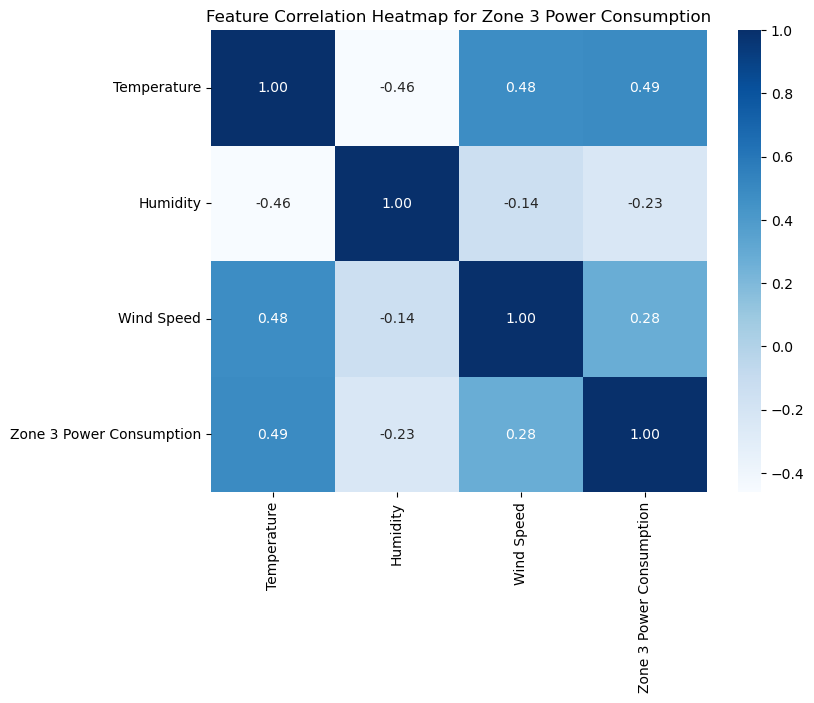

In [269]:
# Heatmap for Zone 3
plt.figure(figsize=(8, 6))
sns.heatmap(corr_zone3, annot=True, cmap='Blues', fmt=".2f")
plt.title("Feature Correlation Heatmap for Zone 3 Power Consumption")
plt.show()

### Interpretation of OLS (Ordinary Least Squares) Model for Zone 3 Power Consumption

The data presented are coefficients from an OLS regression model that predicts Zone 3 power consumption based on three environmental predictors: Temperature, Humidity, and Wind Speed. Each coefficient describes the expected change in power consumption in response to a one-unit change in each predictor, while holding other factors constant.

#### Coefficients:
- **Temperature: 0.489527**
- **Humidity: -0.233022**
- **Wind Speed: 0.278641**
- **Zone 3 Power Consumption (Intercept or Dependent Variable): 1.000000**

#### Interpretation of Coefficients:

- **Temperature (0.489527):** This positive coefficient indicates a strong positive relationship between temperature and power consumption in Zone 3. Specifically, for each unit increase in temperature, power consumption in Zone 3 is expected to increase by 0.489527 units, assuming all other variables are held constant. This suggests that temperature is a critical factor influencing energy usage, likely due to the need for heating or cooling as temperatures fluctuate.

- **Humidity (-0.233022):** The negative coefficient for humidity suggests an inverse relationship with power consumption. Each unit increase in humidity corresponds to a decrease of 0.233022 units in power consumption in Zone 3, other factors being equal. This could indicate that higher humidity may reduce the need for heating or affect cooling system efficiency, thereby decreasing power consumption.

- **Wind Speed (0.278641):** This coefficient indicates a positive relationship with power consumption, though less significant than temperature. An increase in wind speed leads to an increase of 0.278641 units in power consumption in Zone 3. This relationship might be due to wind affecting thermal dynamics of buildings or the operational efficiency of systems like wind-driven ventilation.

#### Summary:
The OLS model highlights temperature as the most significant environmental factor affecting power consumption in Zone 3, corroborating the general expectation of temperature's impact on energy use for climate control. Humidity reduces power consumption, possibly through its effects on heating and cooling efficiencies. Wind speed, although a smaller factor, also positively influences power consumption, suggesting that wind impacts might be specific to regional or structural characteristics in Zone 3.

## Which model is the best for Power Consumption Analysis for Zone 3?

#### Random Forest Regressor is the best model for Zone 3.<br>It provides a good balance between accuracy and handling complex interactions among the predictors. 